# 🍌 Clasificador de Enfermedades en Hojas de Banano — El Oro, Ecuador
---
**Autor:** Joel Velásquez  
**Institución:** Universidad Técnica de Machala (UTMACH)  
**Contexto:** Proyecto para aplicación a la Escuela de Primavera
en Deep Learning — UBA/CONICET 2026

---

## Motivación

El Oro concentra **32,161 hectáreas** de banano (18% de la producción
nacional). En diciembre 2025 se confirmó **Fusarium Raza Tropical 4**
en la provincia, con 8,309 hectáreas en riesgo directo.

Los pequeños productores rurales no tienen herramientas accesibles de
diagnóstico temprano — especialmente en zonas sin conectividad estable.
Este proyecto entrena un clasificador de **7 enfermedades** en hojas de
banano y lo empaqueta en una **APK instalable offline** con Flutter +
TFLite para uso en campo con smartphone.

---

## Relación con trabajo previo en UTMACH

Jiménez et al. (2025) publicaron un clasificador de enfermedades de
banano con EfficientNetB0, ResNet50 y VGG19 sobre un dataset propio
de 900 imágenes de fincas de El Oro, alcanzando 88.90% de accuracy
en 3 clases (Black Sigatoka, Cordana, Healthy). En sus conclusiones
señalan explícitamente que el trabajo puede extenderse a Moko,
Panama Disease y otras enfermedades.

**Este proyecto extiende ese trabajo en 4 dimensiones:**

| Dimensión | Jiménez et al. 2025 | Este proyecto |
|-----------|-------------------|---------------|
| Clases | 3 | **7** (+ Moko, Panama, Insect Pest) |
| Arquitecturas | ResNet50, VGG19, EfficientNetB0 | ResNet18, **MobileNetV2**, EfficientNetB0 |
| Framework | TensorFlow/Keras | **PyTorch** + fine-tuning en 2 fases |
| Despliegue | Webapp Angular/Firebase | **APK nativa TFLite + Flutter (offline)** |
| Evaluación | Split 80/20 | Split **70/15/15** con test set separado |

---

## Clases a detectar

| # | Clase | Dataset fuente | Relevancia en El Oro |
|---|-------|---------------|----------------------|
| 0 | Sigatoka | BananaLSD | Alta — endémica |
| 1 | Cordana | BananaLSD | Media |
| 2 | Pestalotiopsis | BananaLSD | Media |
| 3 | Healthy | BananaLSD | — |
| 4 | Moko | Mendeley/HuggingFace | Alta — cuarentena activa |
| 5 | Panama Disease | Mendeley/HuggingFace | Alta — rel. Fusarium R1 |
| 6 | Insect Pest | Mendeley/HuggingFace | Media |

> **Clases excluidas por ausencia de datos validados:**
> Bacterial Wilt y Fusarium RT4 — documentados como trabajo futuro.

---

## Datasets utilizados

| Dataset | Imágenes | Clases aportadas | DOI |
|---------|----------|-----------------|-----|
| BananaLSD (Augmented) | 1,600 | Sigatoka, Cordana, Pestalotiopsis, Healthy | 10.1016/j.dib.2023.109608 |
| Banana Disease Recognition | 777 | Moko, Panama Disease, Insect Pest | 10.17632/79w2n6b4kf.1 |
| **Total combinado** | **~2,377** | **7 clases** | |

---

## Arquitecturas comparadas

| Modelo | Parámetros | Tamaño | Rol |
|--------|-----------|--------|-----|
| EfficientNet-B0 | 5.3M | ~20 MB | Candidato principal |
| MobileNetV2 | 3.4M | ~14 MB | Candidato APK offline |
| ResNet18 | 11M | ~45 MB | Línea base |

---

## Estructura del notebook

1. Configuración del entorno
2. Descarga de datasets
3. Exploración, combinación y balanceo de clases
4. Preprocesamiento y splits (70/15/15)
5. Entrenamiento — 3 modelos, fine-tuning en 2 fases
6. Evaluación y comparativa (F1-macro, matriz 7×7, Grad-CAM)
7. Exportación a TFLite

## Bloque 0 — Instalaciones y verificación de GPU

Se instalan las librerías necesarias y se verifica que Colab
tenga GPU Tesla T4 asignada (necesaria para entrenar en tiempo
razonable).

In [1]:
# Instalaciones necesarias
!pip install kaggle --quiet
!pip install torchinfo --quiet        # resumen de arquitecturas
!pip install matplotlib seaborn --quiet

import os, shutil, zipfile, random
from pathlib import Path
from collections import Counter

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

import torch
print("="*45)
print(f"  PyTorch version : {torch.__version__}")
print(f"  GPU disponible  : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"  GPU             : {torch.cuda.get_device_name(0)}")
else:
    print("Sin GPU — ir a: Entorno → Cambiar tipo de entorno → T4")
print("="*45)

  PyTorch version : 2.11.0+cu128
  GPU disponible  : True
  GPU             : Tesla T4


## Bloque 1 — Configuración del entorno

Se fija la semilla para reproducibilidad, se define el device
(GPU/CPU), las rutas de trabajo locales y las 7 clases objetivo.

In [2]:
# ── Semillas para reproducibilidad ──────────────────────────
SEED = 42
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ── Rutas locales (todo en Colab) ────────────────────────────
DATA_DIR    = '/content/data'
DS1_DIR     = f'{DATA_DIR}/bananalsd'
DS2_DIR     = f'{DATA_DIR}/banana_disease'
MERGED_DIR  = f'{DATA_DIR}/merged'
CHECKPTS    = '/content/checkpoints'

for path in [DATA_DIR, DS1_DIR, DS2_DIR, MERGED_DIR, CHECKPTS]:
    os.makedirs(path, exist_ok=True)

# ── Clases finales ───────────────────────────────────────────
CLASSES = [
    'Sigatoka',
    'Cordana',
    'Pestalotiopsis',
    'Healthy',
    'Moko',
    'Panama_Disease',
    'Insect_Pest',
]
NUM_CLASSES  = len(CLASSES)
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASSES)}
IDX_TO_CLASS = {i: c for c, i in CLASS_TO_IDX.items()}

print(f"Semilla: {SEED}")
print(f"Device : {DEVICE}")
print(f"\nClases ({NUM_CLASSES}):")
for i, c in enumerate(CLASSES):
    print(f"   {i} — {c}")

Semilla: 42
Device : cuda

Clases (7):
   0 — Sigatoka
   1 — Cordana
   2 — Pestalotiopsis
   3 — Healthy
   4 — Moko
   5 — Panama_Disease
   6 — Insect_Pest


## Bloque 2 — Descarga de datasets

Dos fuentes combinadas para cubrir las 7 clases:

- **BananaLSD** (`shifatearman/bananalsd`): Sigatoka, Cordana,
  Pestalotiopsis, Healthy — 937 imgs originales + 1600 aumentadas
  — campo real, Bangladesh — DOI: 10.1016/j.dib.2023.109608

- **Banana Disease Recognition** (`as-cle-bert/banana-disease-classification`
  vía HuggingFace): Moko, Panama Disease, Insect Pest — 777 imgs
  — DOI: 10.17632/79w2n6b4kf.1

In [3]:
from google.colab import files

print("Subí tu kaggle.json")
print("   Kaggle → Settings → API → Create New Token\n")

uploaded = files.upload()
filename = list(uploaded.keys())[0]

os.makedirs(os.path.expanduser('~/.kaggle'), exist_ok=True)
shutil.move(filename, os.path.expanduser('~/.kaggle/kaggle.json'))
os.chmod(os.path.expanduser('~/.kaggle/kaggle.json'), 0o600)

!kaggle --version
print("Credenciales configuradas")

Subí tu kaggle.json
   Kaggle → Settings → API → Create New Token



Saving kaggle.json to kaggle.json
Kaggle CLI 2.0.2
Credenciales configuradas


In [4]:
IMAGE_EXTS = {'.jpg', '.jpeg', '.png'}

print("Descargando BananaLSD...")
!kaggle datasets download -d shifatearman/bananalsd \
    -p {DS1_DIR} --unzip -q

# ── Ver estructura real descargada ───────────────────────────
print("\n📂 Estructura:")
for root, dirs, files_list in os.walk(DS1_DIR):
    depth = root.replace(DS1_DIR, '').count(os.sep)
    if depth > 3:
        continue
    indent  = '  ' * depth
    n_imgs  = sum(1 for f in files_list
                  if Path(f).suffix.lower() in IMAGE_EXTS)
    etiqueta = f"  → {n_imgs} imgs" if n_imgs > 0 else ""
    print(f"{indent}📂 {os.path.basename(root)}/{etiqueta}")

Descargando BananaLSD...
Dataset URL: https://www.kaggle.com/datasets/shifatearman/bananalsd
License(s): CC-BY-SA-4.0

📂 Estructura:
📂 bananalsd/
  📂 BananaLSD/
    📂 OriginalSet/
      📂 cordana/  → 162 imgs
      📂 pestalotiopsis/  → 173 imgs
      📂 sigatoka/  → 473 imgs
      📂 healthy/  → 129 imgs
    📂 AugmentedSet/
      📂 cordana/  → 400 imgs
      📂 pestalotiopsis/  → 400 imgs
      📂 sigatoka/  → 400 imgs
      📂 healthy/  → 400 imgs


In [7]:
!pip install datasets -q
from datasets import load_dataset

# Clases que usamos de este dataset
# bract_mosaic_virus → descartada (no relevante para El Oro)
MAPA_HF = {
    'moko_disease'  : 'Moko',
    'panama_disease': 'Panama_Disease',
    'insect_pest'   : 'Insect_Pest',
}

print("Descargando Banana Disease Recognition (HuggingFace)...")
ds = load_dataset("as-cle-bert/banana-disease-classification")

label_names = ds['train'].features['label'].names
print(f"\nClases disponibles: {label_names}")
print(f"Clases a extraer  : {list(MAPA_HF.keys())}\n")

# ── Extraer solo las 3 clases que necesitamos ────────────────
conteo = Counter()

for split in ['train', 'test']:
    for ejemplo in ds[split]:
        nombre = label_names[ejemplo['label']]
        if nombre not in MAPA_HF:
            continue
        clase_dest = MAPA_HF[nombre]
        carpeta    = f'{DS2_DIR}/{clase_dest}'
        os.makedirs(carpeta, exist_ok=True)
        idx = conteo[clase_dest]
        ejemplo['image'].save(f'{carpeta}/{split}_{idx:04d}.jpg')
        conteo[clase_dest] += 1

print("Imágenes extraídas:")
for clase, n in conteo.items():
    print(f"   {clase:<20} {n:>4} imgs")

Descargando Banana Disease Recognition (HuggingFace)...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/3.88k [00:00<?, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/30.1M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/3.09M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/700 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/77 [00:00<?, ? examples/s]


Clases disponibles: ['banana_healthy_leaf', 'black_sigatoka', 'bract_mosaic_virus', 'insect_pest', 'moko_disease', 'panama_disease', 'yellow_sigatoka']
Clases a extraer  : ['moko_disease', 'panama_disease', 'insect_pest']

Imágenes extraídas:
   Insect_Pest           111 imgs
   Moko                  111 imgs
   Panama_Disease        111 imgs


In [8]:
def contar_clases(ruta_base, titulo):
    print(f"\n{titulo}")
    print(f"   {'Carpeta':<25} {'Imgs':>6}")
    print(f"   {'-'*32}")
    total = 0
    for carpeta in sorted(os.listdir(ruta_base)):
        ruta = os.path.join(ruta_base, carpeta)
        if not os.path.isdir(ruta):
            continue
        n = sum(1 for f in os.listdir(ruta)
                if Path(f).suffix.lower() in IMAGE_EXTS)
        if n > 0:
            print(f"   {carpeta:<25} {n:>6}")
            total += n
    print(f"   {'TOTAL':<25} {total:>6}")
    return total

print("="*45)
print("  RESUMEN — DATASETS DESCARGADOS")
print("="*45)

# BananaLSD: la estructura real tiene un nivel extra "BananaLSD/"
for sub in ['OriginalSet', 'AugmentedSet']:
    ruta = os.path.join(DS1_DIR, 'BananaLSD', sub)
    if os.path.exists(ruta):
        contar_clases(ruta, f"BananaLSD / {sub}")
    else:
        print(f"\n⚠️  No encontrada: {ruta}")

contar_clases(DS2_DIR, "Banana Disease Recognition")

print("\n" + "="*45)

  RESUMEN — DATASETS DESCARGADOS

BananaLSD / OriginalSet
   Carpeta                     Imgs
   --------------------------------
   cordana                      162
   healthy                      129
   pestalotiopsis               173
   sigatoka                     473
   TOTAL                        937

BananaLSD / AugmentedSet
   Carpeta                     Imgs
   --------------------------------
   cordana                      400
   healthy                      400
   pestalotiopsis               400
   sigatoka                     400
   TOTAL                       1600

Banana Disease Recognition
   Carpeta                     Imgs
   --------------------------------
   Insect_Pest                  111
   Moko                         111
   Panama_Disease               111
   TOTAL                        333



## Bloque 3 — Combinación del dataset

Se usa BananaLSD/AugmentedSet (400 imgs/clase) combinado con
Banana Disease Recognition (111 imgs/clase).

**Hallazgo importante:** se detectó que AugmentedSet contiene
variantes generadas a partir de las imágenes de OriginalSet
(ej. `100.jpeg` → `100_aug.jpeg`), confirmado por inspección de
nombres de archivo y comparación visual. Esto implica riesgo de
data leakage si el split train/val/test se hiciera de forma
puramente aleatoria sobre imágenes individuales — una imagen
original y su variante aumentada podrían terminar en splits
distintos, inflando artificialmente las métricas de test.

**Segundo hallazgo:** las clases de HuggingFace (Moko, Panama_Disease,
Insect_Pest) no tienen variantes `_aug`, pero comparten el mismo
esquema de nombres entre sí (ej. `train_0016.jpg` existe en las
3 clases simultáneamente). Esto requiere incluir la clase en el
identificador de grupo al hacer el split, para no agrupar
incorrectamente imágenes de clases distintas.

**Solución aplicada (Bloque 4):** split por grupo — todas las
variantes/archivos de una misma imagen base, identificados
correctamente por clase, permanecen siempre juntos en el mismo split.

In [9]:
# ── Mapeo: carpeta origen → clase estandarizada ──────────────
MAPA_BANANALSD = {
    'sigatoka'      : 'Sigatoka',
    'cordana'       : 'Cordana',
    'pestalotiopsis': 'Pestalotiopsis',
    'healthy'       : 'Healthy',
}

AUGMENTED_DIR = f'{DS1_DIR}/BananaLSD/AugmentedSet'

# ── Crear carpetas del dataset combinado ─────────────────────
for clase in CLASSES:
    os.makedirs(f'{MERGED_DIR}/{clase}', exist_ok=True)

# ── Copiar BananaLSD/AugmentedSet ────────────────────────────
print("Copiando BananaLSD/AugmentedSet...")
copiado = Counter()

for carpeta_origen, clase_dest in MAPA_BANANALSD.items():
    ruta_origen = f'{AUGMENTED_DIR}/{carpeta_origen}'
    if not os.path.exists(ruta_origen):
        print(f"No encontrada: {ruta_origen}")
        continue
    for img_file in os.listdir(ruta_origen):
        if Path(img_file).suffix.lower() not in IMAGE_EXTS:
            continue
        nuevo_nombre = f"lsd_{img_file}"
        shutil.copy2(
            f'{ruta_origen}/{img_file}',
            f'{MERGED_DIR}/{clase_dest}/{nuevo_nombre}'
        )
        copiado[clase_dest] += 1

for clase, n in copiado.items():
    print(f"{clase:<20} {n:>4} imgs")

# ── Copiar HuggingFace (ya están en DS2_DIR) ─────────────────
print("\nCopiando Banana Disease Recognition...")
copiado_hf = Counter()

for clase in ['Moko', 'Panama_Disease', 'Insect_Pest']:
    ruta_origen = f'{DS2_DIR}/{clase}'
    for img_file in os.listdir(ruta_origen):
        if Path(img_file).suffix.lower() not in IMAGE_EXTS:
            continue
        nuevo_nombre = f"hf_{img_file}"
        shutil.copy2(
            f'{ruta_origen}/{img_file}',
            f'{MERGED_DIR}/{clase}/{nuevo_nombre}'
        )
        copiado_hf[clase] += 1

for clase, n in copiado_hf.items():
    print(f"{clase:<20} {n:>4} imgs")

Copiando BananaLSD/AugmentedSet...
Sigatoka              400 imgs
Cordana               400 imgs
Pestalotiopsis        400 imgs
Healthy               400 imgs

Copiando Banana Disease Recognition...
Moko                  111 imgs
Panama_Disease        111 imgs
Insect_Pest           111 imgs


  DATASET COMBINADO FINAL
   Sigatoka               400 imgs
   Cordana                400 imgs
   Pestalotiopsis         400 imgs
   Healthy                400 imgs
   Moko                   111 imgs
   Panama_Disease         111 imgs
   Insect_Pest            111 imgs

   TOTAL                 1933 imgs


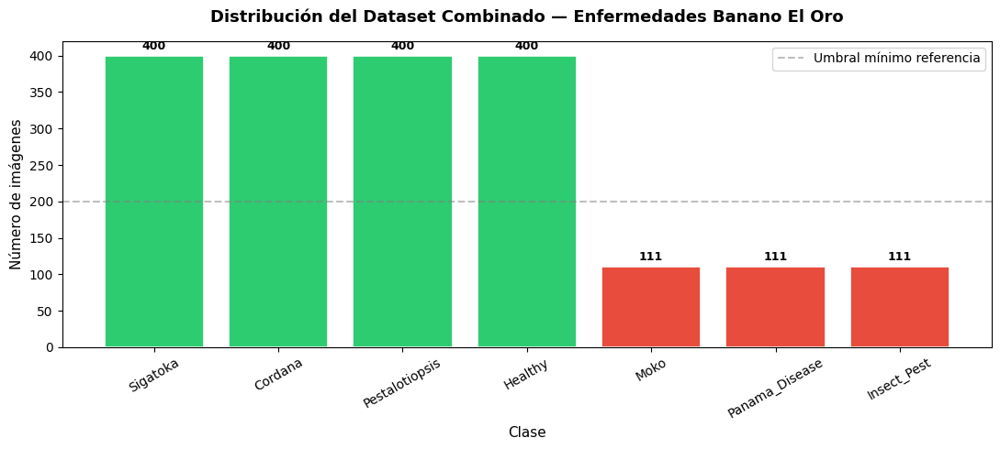

Gráfico guardado


In [10]:
print("="*50)
print("  DATASET COMBINADO FINAL")
print("="*50)

totales = {}
for clase in CLASSES:
    n = sum(1 for f in os.listdir(f'{MERGED_DIR}/{clase}')
            if Path(f).suffix.lower() in IMAGE_EXTS)
    totales[clase] = n
    print(f"   {clase:<20} {n:>5} imgs")

total_general = sum(totales.values())
print(f"\n   {'TOTAL':<20} {total_general:>5} imgs")
print("="*50)

# ── Gráfico de distribución ──────────────────────────────────
fig, ax = plt.subplots(figsize=(11, 5))

colores = ['#2ecc71' if v >= 300 else '#e67e22' if v >= 150
           else '#e74c3c' for v in totales.values()]

bars = ax.bar(totales.keys(), totales.values(),
              color=colores, edgecolor='white', linewidth=1.2)

ax.set_title('Distribución del Dataset Combinado — Enfermedades Banano El Oro',
             fontsize=13, fontweight='bold', pad=15)
ax.set_xlabel('Clase', fontsize=11)
ax.set_ylabel('Número de imágenes', fontsize=11)
ax.tick_params(axis='x', rotation=30)
ax.axhline(y=200, color='gray', linestyle='--',
           alpha=0.5, label='Umbral mínimo referencia')
ax.legend()

for bar, (clase, val) in zip(bars, totales.items()):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + 8,
            str(val), ha='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig('/content/distribucion_dataset.png',
            dpi=150, bbox_inches='tight')
plt.show()
print("Gráfico guardado")

In [11]:
# ── Verificar nombres de archivo en OriginalSet vs AugmentedSet ──
orig_path = f'{DS1_DIR}/BananaLSD/OriginalSet/sigatoka'
aug_path  = f'{DS1_DIR}/BananaLSD/AugmentedSet/sigatoka'

print("📂 Muestra de nombres en OriginalSet/sigatoka:")
for f in sorted(os.listdir(orig_path))[:10]:
    print(f"   {f}")

print("\n📂 Muestra de nombres en AugmentedSet/sigatoka:")
for f in sorted(os.listdir(aug_path))[:10]:
    print(f"   {f}")

# ── Verificar si hay nombres compartidos ──────────────────────
orig_names = set(f.split('.')[0] for f in os.listdir(orig_path))
aug_names  = set(f.split('.')[0] for f in os.listdir(aug_path))

interseccion = orig_names & aug_names
print(f"\n🔍 Nombres idénticos entre Original y Augmented: {len(interseccion)}")

📂 Muestra de nombres en OriginalSet/sigatoka:
   0.jpeg
   1.jpeg
   10.jpeg
   100.jpeg
   101.jpeg
   102.jpeg
   103.jpeg
   104.jpeg
   105.jpeg
   106.jpeg

📂 Muestra de nombres en AugmentedSet/sigatoka:
   0_aug.jpeg
   100_aug.jpeg
   101_aug.jpeg
   102_aug.jpeg
   103_aug.jpeg
   104_aug.jpeg
   105_aug.jpeg
   106_aug.jpeg
   107_aug.jpeg
   108_aug.jpeg

🔍 Nombres idénticos entre Original y Augmented: 0


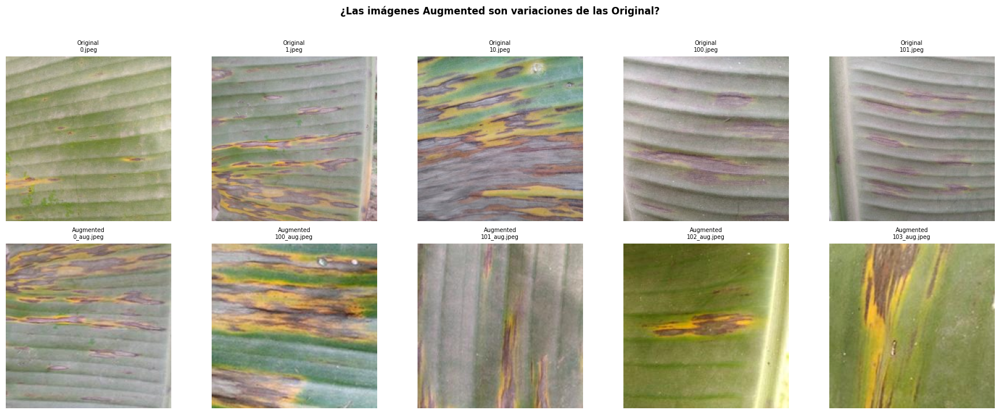

In [12]:
# ── Comparar visualmente unas pocas imágenes de cada set ────
fig, axes = plt.subplots(2, 5, figsize=(18, 7))

orig_files = sorted(os.listdir(orig_path))[:5]
aug_files  = sorted(os.listdir(aug_path))[:5]

for i, f in enumerate(orig_files):
    img = mpimg.imread(f'{orig_path}/{f}')
    axes[0, i].imshow(img)
    axes[0, i].set_title(f'Original\n{f}', fontsize=7)
    axes[0, i].axis('off')

for i, f in enumerate(aug_files):
    img = mpimg.imread(f'{aug_path}/{f}')
    axes[1, i].imshow(img)
    axes[1, i].set_title(f'Augmented\n{f}', fontsize=7)
    axes[1, i].axis('off')

plt.suptitle('¿Las imágenes Augmented son variaciones de las Original?',
             fontsize=12, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

In [13]:
# Verificar si HuggingFace tiene el mismo patrón de _aug
muestra_hf = sorted(os.listdir(f'{DS2_DIR}/Moko'))[:10]
print("📂 Nombres en Moko (HuggingFace):")
for f in muestra_hf:
    print(f"   {f}")

📂 Nombres en Moko (HuggingFace):
   test_0100.jpg
   test_0101.jpg
   test_0102.jpg
   test_0103.jpg
   test_0104.jpg
   test_0105.jpg
   test_0106.jpg
   test_0107.jpg
   test_0108.jpg
   test_0109.jpg


In [14]:
# ── Verificación que reveló la causa del leakage en HuggingFace:
#    los nombres de archivo (train_0056.jpg, etc.) se repiten
#    entre Moko, Panama_Disease e Insect_Pest, ya que provienen de
#    índices independientes en el dataset original. Esto requiere
#    incluir la clase en el identificador de grupo al hacer el split
#    (ver Bloque 4).
nombres_moko    = set(os.listdir(f'{DS2_DIR}/Moko'))
nombres_panama  = set(os.listdir(f'{DS2_DIR}/Panama_Disease'))
nombres_insect  = set(os.listdir(f'{DS2_DIR}/Insect_Pest'))

interseccion_moko_panama   = nombres_moko & nombres_panama
interseccion_moko_insect   = nombres_moko & nombres_insect
interseccion_panama_insect = nombres_panama & nombres_insect

print(f"Nombres repetidos Moko ∩ Panama_Disease : {len(interseccion_moko_panama)}")
print(f"Nombres repetidos Moko ∩ Insect_Pest     : {len(interseccion_moko_insect)}")
print(f"Nombres repetidos Panama ∩ Insect_Pest    : {len(interseccion_panama_insect)}")

if interseccion_moko_panama:
    ejemplo = list(interseccion_moko_panama)[0]
    print(f"\nEjemplo de nombre repetido: {ejemplo}")

Nombres repetidos Moko ∩ Panama_Disease : 111
Nombres repetidos Moko ∩ Insect_Pest     : 111
Nombres repetidos Panama ∩ Insect_Pest    : 111

Ejemplo de nombre repetido: train_0016.jpg


## Bloque 4 — Preprocesamiento y splits

Split estratificado por grupo: 70% train / 15% val / 15% test.

Se usa split por grupo (no por imagen individual) para evitar
data leakage detectado en BananaLSD/AugmentedSet — las variantes
aumentadas de una misma imagen base (ej. `100.jpeg` y `100_aug.jpeg`)
permanecen siempre juntas en el mismo split.

Normalización con media y std de ImageNet (estándar para transfer learning).
Data augmentation (online) aplicada solo al conjunto de entrenamiento.

In [15]:
import re
from collections import Counter

# ── Función para extraer el "grupo" (imagen base) de cada archivo ──
def extraer_grupo(filepath, clase):
    filename = os.path.basename(filepath)

    if clase in ['Moko', 'Panama_Disease', 'Insect_Pest']:
        # HuggingFace: nombres repetidos ENTRE clases (hf_train_0056.jpg
        # existe en Moko, Panama y Insect_Pest) — incluir clase en el grupo
        return f"{clase}_{filename}"

    # BananaLSD: agrupar por número base, ignorando "_aug"
    nombre_sin_prefijo = filename.replace('lsd_', '')
    match = re.match(r'(\d+)', nombre_sin_prefijo)
    if match:
        return f"{clase}_{match.group(1)}"
    return f"{clase}_{filename}"


# ── Recolectar imágenes con su grupo ──────────────────────────
all_paths  = []
all_labels = []
all_groups = []

for clase in CLASSES:
    carpeta = f'{MERGED_DIR}/{clase}'
    imgs = [f'{carpeta}/{f}' for f in os.listdir(carpeta)
            if Path(f).suffix.lower() in IMAGE_EXTS]
    for img_path in imgs:
        all_paths.append(img_path)
        all_labels.append(CLASS_TO_IDX[clase])
        all_groups.append(extraer_grupo(img_path, clase))

print(f"Total imágenes      : {len(all_paths)}")
print(f"Total grupos únicos : {len(set(all_groups))}")

tam_grupos = Counter(all_groups)
distrib = Counter(tam_grupos.values())
print(f"\nDistribución de tamaño de grupo:")
for tam, n in sorted(distrib.items()):
    print(f"   Grupos con {tam} imagen(es): {n}")

Total imágenes      : 1933
Total grupos únicos : 1933

Distribución de tamaño de grupo:
   Grupos con 1 imagen(es): 1933


In [22]:
def split_por_grupo_estratificado(paths, labels, groups, test_size, seed):
    """Divide manteniendo grupos completos y balance de clases."""
    paths  = np.array(paths)
    labels = np.array(labels)
    groups = np.array(groups)

    idx_train, idx_test = [], []

    for clase_idx in range(NUM_CLASSES):
        mask_clase = labels == clase_idx
        grupos_clase = np.unique(groups[mask_clase])

        rng = np.random.RandomState(seed + clase_idx)
        rng.shuffle(grupos_clase)

        n_test_grupos = max(1, int(len(grupos_clase) * test_size))
        grupos_test  = set(grupos_clase[:n_test_grupos])
        grupos_train = set(grupos_clase[n_test_grupos:])

        for i in np.where(mask_clase)[0]:
            if groups[i] in grupos_test:
                idx_test.append(i)
            else:
                idx_train.append(i)

    return (paths[idx_train].tolist(), paths[idx_test].tolist(),
            labels[idx_train].tolist(), labels[idx_test].tolist(),
            groups[idx_train].tolist(), groups[idx_test].tolist())


# ── Paso 1: separar test (15%) ────────────────────────────────
train_val_paths, test_paths, train_val_labels, test_labels, \
train_val_groups, test_groups = split_por_grupo_estratificado(
    all_paths, all_labels, all_groups, test_size=0.15, seed=SEED
)

# ── Paso 2: separar val (15% del total ≈ 17.6% del restante) ──
train_paths, val_paths, train_labels, val_labels, \
train_groups, val_groups = split_por_grupo_estratificado(
    train_val_paths, train_val_labels, train_val_groups,
    test_size=0.176, seed=SEED
)

print(f"Splits (group-based, sin leakage):")
print(f"   Train : {len(train_paths):>5} imgs ({len(train_paths)/len(all_paths)*100:.1f}%)")
print(f"   Val   : {len(val_paths):>5} imgs ({len(val_paths)/len(all_paths)*100:.1f}%)")
print(f"   Test  : {len(test_paths):>5} imgs ({len(test_paths)/len(all_paths)*100:.1f}%)")

# ── Verificar que NO hay grupos compartidos entre splits ──────
set_train = set(train_groups)
set_val   = set(val_groups)
set_test  = set(test_groups)

print(f"\nVerificación de leakage:")
print(f"   Grupos compartidos train∩val  : {len(set_train & set_val)}")
print(f"   Grupos compartidos train∩test : {len(set_train & set_test)}")
print(f"   Grupos compartidos val∩test   : {len(set_val & set_test)}")

total_leak = (len(set_train & set_val) + len(set_train & set_test)
              + len(set_val & set_test))
if total_leak == 0:
    print(f"Sin leakage — ningún grupo aparece en más de un split")
else:
    print(f"Hay leakage — revisar lógica")

# ── Distribución por clase en cada split ──────────────────────
print(f"\nDistribución por clase:")
print(f"   {'Clase':<20} {'Train':>6} {'Val':>6} {'Test':>6}")
print(f"   {'-'*40}")
for i, clase in enumerate(CLASSES):
    n_train = train_labels.count(i)
    n_val   = val_labels.count(i)
    n_test  = test_labels.count(i)
    print(f"   {clase:<20} {n_train:>6} {n_val:>6} {n_test:>6}")

Splits (group-based, sin leakage):
   Train :  1361 imgs (70.4%)
   Val   :   284 imgs (14.7%)
   Test  :   288 imgs (14.9%)

Verificación de leakage:
   Grupos compartidos train∩val  : 0
   Grupos compartidos train∩test : 0
   Grupos compartidos val∩test   : 0
Sin leakage — ningún grupo aparece en más de un split

Distribución por clase:
   Clase                 Train    Val   Test
   ----------------------------------------
   Sigatoka                281     59     60
   Cordana                 281     59     60
   Pestalotiopsis          281     59     60
   Healthy                 281     59     60
   Moko                     79     16     16
   Panama_Disease           79     16     16
   Insect_Pest              79     16     16


In [25]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.2),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3,
                           saturation=0.2, hue=0.05),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

class BananoDataset(Dataset):
    def __init__(self, paths, labels, transform=None):
        self.paths     = paths
        self.labels    = labels
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img, self.labels[idx]

train_dataset = BananoDataset(train_paths, train_labels, transform_train)
val_dataset   = BananoDataset(val_paths,   val_labels,   transform_val_test)
test_dataset  = BananoDataset(test_paths,  test_labels,  transform_val_test)

class_counts  = [train_labels.count(i) for i in range(NUM_CLASSES)]
class_weights = [1.0 / c for c in class_counts]
sample_weights = [class_weights[l] for l in train_labels]

sampler = torch.utils.data.WeightedRandomSampler(
    weights     = sample_weights,
    num_samples = len(train_labels),
    replacement = True
)

BATCH_SIZE = 32

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                          sampler=sampler, num_workers=2,
                          pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE,
                          shuffle=False,  num_workers=2,
                          pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE,
                          shuffle=False,  num_workers=2,
                          pin_memory=True)

print("DataLoaders listos")
print(f"   Batch size : {BATCH_SIZE}")
print(f"   Train batchs : {len(train_loader)}")
print(f"   Val batchs   : {len(val_loader)}")
print(f"   Test batchs  : {len(test_loader)}")
print(f"\n   WeightedSampler activo → compensa desbalance "
      f"{max(class_counts)}/{min(class_counts)} en train")

DataLoaders listos
   Batch size : 32
   Train batchs : 43
   Val batchs   : 9
   Test batchs  : 9

   WeightedSampler activo → compensa desbalance 281/79 en train


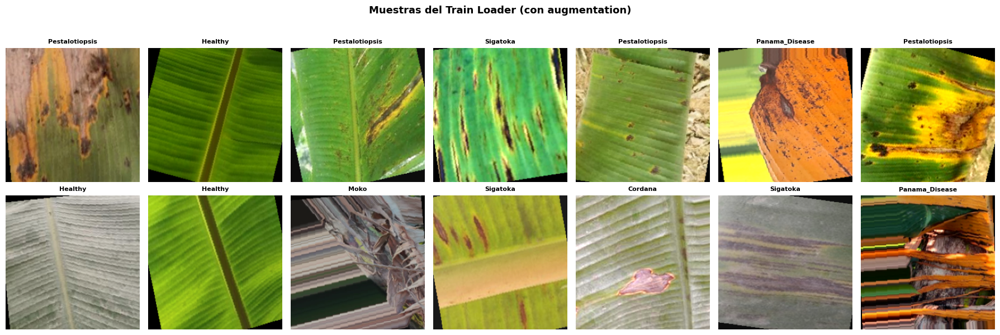

Visualización guardada


In [26]:
# ── Desnormalizar para visualizar ────────────────────────────
def desnormalizar(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    return torch.clamp(tensor * std + mean, 0, 1)

# ── Tomar un batch y mostrar 14 muestras ─────────────────────
imgs_batch, labels_batch = next(iter(train_loader))

fig, axes = plt.subplots(2, 7, figsize=(18, 6))
axes = axes.flatten()

for i in range(14):
    img = desnormalizar(imgs_batch[i]).permute(1, 2, 0).numpy()
    axes[i].imshow(img)
    axes[i].set_title(IDX_TO_CLASS[labels_batch[i].item()],
                      fontsize=8, fontweight='bold')
    axes[i].axis('off')

plt.suptitle('Muestras del Train Loader (con augmentation)',
             fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('/content/muestras_train.png', dpi=150, bbox_inches='tight')
plt.show()
print("Visualización guardada")

## Bloque 5 — Definición de los 3 modelos

Fine-tuning en dos fases para cada arquitectura:
- Fase A (Feature Extraction): backbone congelado, solo se entrena
  el clasificador. 10 épocas, lr=1e-3.
- Fase B (Fine-tuning completo): backbone descongelado, toda la red
  entrena con lr bajo. 20 épocas, lr=1e-4.

Weighted loss para compensar desbalance 281/79 entre clases en train.

In [28]:
# Definir los 3 modelos

import torchvision.models as models
import torch.nn as nn
from torchinfo import summary

def construir_modelo(nombre, num_classes=NUM_CLASSES, pretrained=True):
    weights = 'DEFAULT' if pretrained else None

    if nombre == 'efficientnet_b0':
        modelo = models.efficientnet_b0(weights=weights)
        in_features = modelo.classifier[1].in_features
        modelo.classifier = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(in_features, num_classes)
        )

    elif nombre == 'mobilenet_v2':
        modelo = models.mobilenet_v2(weights=weights)
        in_features = modelo.classifier[1].in_features
        modelo.classifier = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(in_features, num_classes)
        )

    elif nombre == 'resnet18':
        modelo = models.resnet18(weights=weights)
        in_features = modelo.fc.in_features
        modelo.fc = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(in_features, num_classes)
        )

    return modelo.to(DEVICE), None


def congelar_backbone(modelo, nombre):
    for param in modelo.parameters():
        param.requires_grad = False
    if nombre == 'resnet18':
        for param in modelo.fc.parameters():
            param.requires_grad = True
    else:
        for param in modelo.classifier.parameters():
            param.requires_grad = True


def descongelar_todo(modelo):
    for param in modelo.parameters():
        param.requires_grad = True


def contar_params(modelo):
    total     = sum(p.numel() for p in modelo.parameters())
    trainable = sum(p.numel() for p in modelo.parameters()
                    if p.requires_grad)
    return total, trainable


print("="*55)
print("  VERIFICACIÓN DE MODELOS")
print("="*55)

for nombre in ['efficientnet_b0', 'mobilenet_v2', 'resnet18']:
    modelo, _ = construir_modelo(nombre)
    congelar_backbone(modelo, nombre)
    total, trainable = contar_params(modelo)
    print(f"\n  {nombre}")
    print(f"    Parámetros totales    : {total:>10,}")
    print(f"    Entrenables (Fase A)  : {trainable:>10,}")
    del modelo
    torch.cuda.empty_cache()

print("\nLos 3 modelos construidos correctamente")

  VERIFICACIÓN DE MODELOS

  efficientnet_b0
    Parámetros totales    :  4,016,515
    Entrenables (Fase A)  :      8,967

  mobilenet_v2
    Parámetros totales    :  2,232,839
    Entrenables (Fase A)  :      8,967

  resnet18
    Parámetros totales    : 11,180,103
    Entrenables (Fase A)  :      3,591

Los 3 modelos construidos correctamente


In [30]:
#Funciones de entrenamiento y evaluación

import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR

conteo_train = [train_labels.count(i) for i in range(NUM_CLASSES)]
pesos_clases = torch.tensor(
    [1.0 / c for c in conteo_train], dtype=torch.float32
).to(DEVICE)
pesos_clases = pesos_clases / pesos_clases.sum() * NUM_CLASSES

criterion = nn.CrossEntropyLoss(weight=pesos_clases)

print("Pesos por clase (weighted loss):")
for i, clase in enumerate(CLASSES):
    print(f"   {clase:<20} peso: {pesos_clases[i].item():.4f}")


def entrenar_epoch(modelo, loader, optimizer):
    modelo.train()
    loss_total, correctos, total = 0, 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = modelo(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        loss_total += loss.item() * imgs.size(0)
        preds = outputs.argmax(dim=1)
        correctos += (preds == labels).sum().item()
        total += imgs.size(0)
    return loss_total / total, correctos / total


def evaluar(modelo, loader):
    modelo.eval()
    loss_total, correctos, total = 0, 0, 0
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
            outputs = modelo(imgs)
            loss = criterion(outputs, labels)
            loss_total += loss.item() * imgs.size(0)
            preds = outputs.argmax(dim=1)
            correctos += (preds == labels).sum().item()
            total += imgs.size(0)
    return loss_total / total, correctos / total


def entrenar_modelo(nombre, epocas_a=10, epocas_b=20, lr_a=1e-3, lr_b=1e-4):
    print(f"\n{'='*55}")
    print(f"  ENTRENANDO: {nombre.upper()}")
    print(f"{'='*55}")

    modelo, _ = construir_modelo(nombre)
    historial = {'train_loss': [], 'val_loss': [],
                 'train_acc': [],  'val_acc': []}
    mejor_val_acc = 0

    print(f"\n  FASE A — Backbone congelado ({epocas_a} épocas, lr={lr_a})")
    congelar_backbone(modelo, nombre)
    optimizer = optim.Adam(
        filter(lambda p: p.requires_grad, modelo.parameters()), lr=lr_a
    )
    scheduler = CosineAnnealingLR(optimizer, T_max=epocas_a)

    for epoca in range(epocas_a):
        tr_loss, tr_acc = entrenar_epoch(modelo, train_loader, optimizer)
        vl_loss, vl_acc = evaluar(modelo, val_loader)
        scheduler.step()
        historial['train_loss'].append(tr_loss)
        historial['val_loss'].append(vl_loss)
        historial['train_acc'].append(tr_acc)
        historial['val_acc'].append(vl_acc)
        if (epoca + 1) % 2 == 0 or epoca == 0:
            print(f"  Época {epoca+1:>3}/{epocas_a} | "
                  f"loss: {tr_loss:.4f} | acc: {tr_acc:.4f} | "
                  f"val_loss: {vl_loss:.4f} | val_acc: {vl_acc:.4f}")

    print(f"\n  FASE B — Fine-tuning completo ({epocas_b} épocas, lr={lr_b})")
    descongelar_todo(modelo)
    optimizer = optim.Adam(modelo.parameters(), lr=lr_b)
    scheduler = CosineAnnealingLR(optimizer, T_max=epocas_b)

    for epoca in range(epocas_b):
        tr_loss, tr_acc = entrenar_epoch(modelo, train_loader, optimizer)
        vl_loss, vl_acc = evaluar(modelo, val_loader)
        scheduler.step()
        historial['train_loss'].append(tr_loss)
        historial['val_loss'].append(vl_loss)
        historial['train_acc'].append(tr_acc)
        historial['val_acc'].append(vl_acc)
        if vl_acc > mejor_val_acc:
            mejor_val_acc = vl_acc
            torch.save(modelo.state_dict(),
                       f'{CHECKPTS}/{nombre}_mejor.pth')
        if (epoca + 1) % 5 == 0 or epoca == 0:
            marca = " ⭐" if vl_acc == mejor_val_acc else ""
            print(f"  Época {epoca+1:>3}/{epocas_b} | "
                  f"loss: {tr_loss:.4f} | acc: {tr_acc:.4f} | "
                  f"val_loss: {vl_loss:.4f} | val_acc: {vl_acc:.4f}{marca}")

    print(f"\n  Mejor val_acc: {mejor_val_acc:.4f}")
    print(f"  Checkpoint guardado: {CHECKPTS}/{nombre}_mejor.pth")
    return modelo, historial, mejor_val_acc

print("Funciones de entrenamiento listas")

Pesos por clase (weighted loss):
   Sigatoka             peso: 0.4771
   Cordana              peso: 0.4771
   Pestalotiopsis       peso: 0.4771
   Healthy              peso: 0.4771
   Moko                 peso: 1.6972
   Panama_Disease       peso: 1.6972
   Insect_Pest          peso: 1.6972
Funciones de entrenamiento listas


## Bloque 6 — Entrenamiento de los 3 modelos

Reentrenamiento sobre el split corregido (group-based, sin leakage).
Misma estrategia que antes: Fase A (10 épocas, backbone congelado) +
Fase B (20 épocas, fine-tuning completo).

In [31]:
modelo_eff, hist_eff, best_eff = entrenar_modelo('efficientnet_b0')


  ENTRENANDO: EFFICIENTNET_B0

  FASE A — Backbone congelado (10 épocas, lr=0.001)
  Época   1/10 | loss: 1.1609 | acc: 0.4864 | val_loss: 1.1927 | val_acc: 0.7077
  Época   2/10 | loss: 0.6039 | acc: 0.8156 | val_loss: 0.7824 | val_acc: 0.8239
  Época   4/10 | loss: 0.3379 | acc: 0.8957 | val_loss: 0.5022 | val_acc: 0.8803
  Época   6/10 | loss: 0.2927 | acc: 0.8993 | val_loss: 0.4132 | val_acc: 0.9014
  Época   8/10 | loss: 0.2411 | acc: 0.9243 | val_loss: 0.3759 | val_acc: 0.9366
  Época  10/10 | loss: 0.2443 | acc: 0.9236 | val_loss: 0.3806 | val_acc: 0.9366

  FASE B — Fine-tuning completo (20 épocas, lr=0.0001)
  Época   1/20 | loss: 0.1653 | acc: 0.9442 | val_loss: 0.1621 | val_acc: 0.9648 ⭐
  Época   5/20 | loss: 0.0233 | acc: 0.9934 | val_loss: 0.0393 | val_acc: 0.9824
  Época  10/20 | loss: 0.0120 | acc: 0.9941 | val_loss: 0.0245 | val_acc: 0.9894
  Época  15/20 | loss: 0.0091 | acc: 0.9978 | val_loss: 0.0226 | val_acc: 0.9894
  Época  20/20 | loss: 0.0103 | acc: 0.9978 | va

In [32]:
modelo_mob, hist_mob, best_mob = entrenar_modelo('mobilenet_v2')


  ENTRENANDO: MOBILENET_V2

  FASE A — Backbone congelado (10 épocas, lr=0.001)
  Época   1/10 | loss: 1.2917 | acc: 0.4431 | val_loss: 1.2686 | val_acc: 0.6373
  Época   2/10 | loss: 0.6959 | acc: 0.7935 | val_loss: 0.8576 | val_acc: 0.7852
  Época   4/10 | loss: 0.4084 | acc: 0.8854 | val_loss: 0.5825 | val_acc: 0.8556
  Época   6/10 | loss: 0.3163 | acc: 0.9199 | val_loss: 0.4795 | val_acc: 0.8732
  Época   8/10 | loss: 0.3011 | acc: 0.9045 | val_loss: 0.4638 | val_acc: 0.8838
  Época  10/10 | loss: 0.2935 | acc: 0.9045 | val_loss: 0.4304 | val_acc: 0.8838

  FASE B — Fine-tuning completo (20 épocas, lr=0.0001)
  Época   1/20 | loss: 0.1789 | acc: 0.9375 | val_loss: 0.2019 | val_acc: 0.9366 ⭐
  Época   5/20 | loss: 0.0442 | acc: 0.9838 | val_loss: 0.0547 | val_acc: 0.9824 ⭐
  Época  10/20 | loss: 0.0234 | acc: 0.9919 | val_loss: 0.0213 | val_acc: 0.9930 ⭐
  Época  15/20 | loss: 0.0188 | acc: 0.9949 | val_loss: 0.0232 | val_acc: 0.9930 ⭐
  Época  20/20 | loss: 0.0123 | acc: 0.9978 |

In [33]:
modelo_res, hist_res, best_res = entrenar_modelo('resnet18')


  ENTRENANDO: RESNET18

  FASE A — Backbone congelado (10 épocas, lr=0.001)
  Época   1/10 | loss: 1.4704 | acc: 0.3012 | val_loss: 1.4175 | val_acc: 0.5035
  Época   2/10 | loss: 0.8618 | acc: 0.6267 | val_loss: 0.9480 | val_acc: 0.7148
  Época   4/10 | loss: 0.5375 | acc: 0.7855 | val_loss: 0.5683 | val_acc: 0.8380
  Época   6/10 | loss: 0.4485 | acc: 0.8391 | val_loss: 0.4856 | val_acc: 0.8732
  Época   8/10 | loss: 0.4025 | acc: 0.8347 | val_loss: 0.4466 | val_acc: 0.8732
  Época  10/10 | loss: 0.4089 | acc: 0.8516 | val_loss: 0.4638 | val_acc: 0.8803

  FASE B — Fine-tuning completo (20 épocas, lr=0.0001)
  Época   1/20 | loss: 0.1692 | acc: 0.9273 | val_loss: 0.0746 | val_acc: 0.9789 ⭐
  Época   5/20 | loss: 0.0531 | acc: 0.9758 | val_loss: 0.0185 | val_acc: 0.9965 ⭐
  Época  10/20 | loss: 0.0120 | acc: 0.9934 | val_loss: 0.0076 | val_acc: 0.9965 ⭐
  Época  15/20 | loss: 0.0055 | acc: 0.9993 | val_loss: 0.0131 | val_acc: 0.9894
  Época  20/20 | loss: 0.0062 | acc: 0.9985 | val_l

## Bloque 7 — Evaluación en Test Set

Evaluación sobre el split de test corregido (group-based, sin leakage).
Se carga el mejor checkpoint de cada modelo y se mide su desempeño
real de generalización a imágenes nunca vistas.

In [37]:
# Evaluación completa en test set

from sklearn.metrics import (classification_report, confusion_matrix,
                             f1_score, precision_score, recall_score)
import itertools

def evaluar_test(nombre_modelo):
    modelo, _ = construir_modelo(nombre_modelo, pretrained=False)
    checkpoint = f'{CHECKPTS}/{nombre_modelo}_mejor.pth'
    modelo.load_state_dict(torch.load(checkpoint, map_location=DEVICE))
    modelo.eval()

    all_preds  = []
    all_labels = []

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(DEVICE)
            outputs = modelo(imgs)
            preds = outputs.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy())

    acc  = sum(p == l for p, l in zip(all_preds, all_labels)) / len(all_labels)
    f1   = f1_score(all_labels, all_preds, average='macro')
    prec = precision_score(all_labels, all_preds, average='macro')
    rec  = recall_score(all_labels, all_preds, average='macro')

    return all_preds, all_labels, acc, f1, prec, rec


print("="*60)
print("  RESULTADOS EN TEST SET (split sin leakage)")
print("="*60)
print(f"\n  {'Modelo':<20} {'Acc':>7} {'F1':>7} {'Prec':>7} {'Rec':>7}")
print(f"  {'-'*50}")

resultados = {}
nombres = ['efficientnet_b0', 'mobilenet_v2', 'resnet18']

for nombre in nombres:
    preds, labels, acc, f1, prec, rec = evaluar_test(nombre)
    resultados[nombre] = {
        'preds': preds, 'labels': labels,
        'acc': acc, 'f1': f1, 'prec': prec, 'rec': rec
    }
    print(f"  {nombre:<20} {acc:>7.4f} {f1:>7.4f} {prec:>7.4f} {rec:>7.4f}")

  RESULTADOS EN TEST SET (split sin leakage)

  Modelo                   Acc      F1    Prec     Rec
  --------------------------------------------------
  efficientnet_b0       1.0000  1.0000  1.0000  1.0000
  mobilenet_v2          0.9931  0.9921  0.9893  0.9952
  resnet18              0.9965  0.9911  0.9916  0.9911


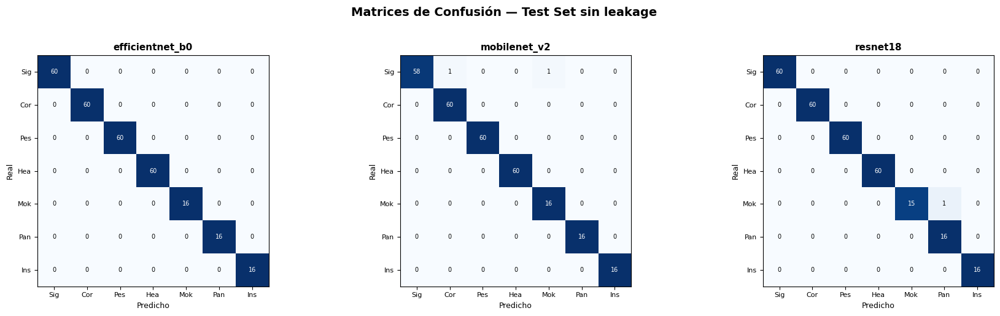

In [55]:
#Matrices de confusión

def plot_confusion_matrix(labels, preds, nombre_modelo, ax):
    cm = confusion_matrix(labels, preds)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    im = ax.imshow(cm_norm, interpolation='nearest', cmap='Blues')
    ax.set_title(nombre_modelo, fontsize=11, fontweight='bold')

    tick_marks = np.arange(NUM_CLASSES)
    nombres_cortos = ['Sig', 'Cor', 'Pes', 'Hea', 'Mok', 'Pan', 'Ins']
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)
    ax.set_xticklabels(nombres_cortos, fontsize=8)
    ax.set_yticklabels(nombres_cortos, fontsize=8)

    thresh = cm_norm.max() / 2.0
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        ax.text(j, i, f'{cm[i,j]}',
                ha='center', va='center', fontsize=7,
                color='white' if cm_norm[i, j] > thresh else 'black')

    ax.set_ylabel('Real', fontsize=9)
    ax.set_xlabel('Predicho', fontsize=9)


fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, nombre in zip(axes, nombres):
    plot_confusion_matrix(
        resultados[nombre]['labels'],
        resultados[nombre]['preds'],
        nombre, ax
    )
plt.suptitle('Matrices de Confusión — Test Set sin leakage',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('/content/matrices_confusion_v2.png', dpi=150, bbox_inches='tight')
plt.show()

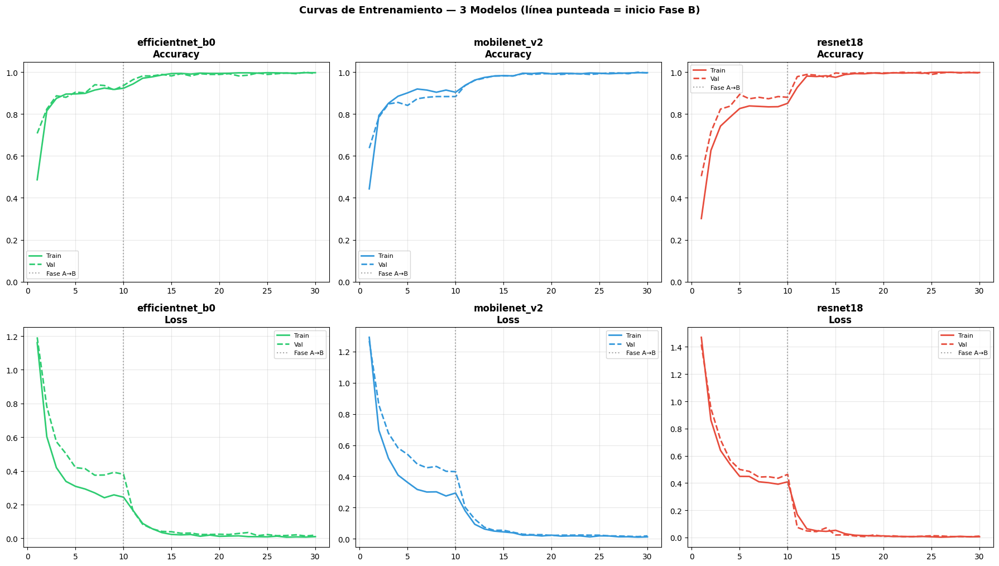

✅ Gráficos guardados


In [56]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
historiales = {
    'efficientnet_b0': hist_eff,
    'mobilenet_v2'   : hist_mob,
    'resnet18'       : hist_res,
}
colores = {
    'efficientnet_b0': '#2ecc71',
    'mobilenet_v2'   : '#3498db',
    'resnet18'       : '#e74c3c',
}

for idx, (nombre, hist) in enumerate(historiales.items()):
    epocas = range(1, len(hist['train_acc']) + 1)
    color  = colores[nombre]

    # Accuracy
    axes[0, idx].plot(epocas, hist['train_acc'],
                      color=color, label='Train', linewidth=2)
    axes[0, idx].plot(epocas, hist['val_acc'],
                      color=color, linestyle='--', label='Val', linewidth=2)
    axes[0, idx].axvline(x=10, color='gray', linestyle=':', alpha=0.7,
                         label='Fase A→B')
    axes[0, idx].set_title(f'{nombre}\nAccuracy', fontweight='bold')
    axes[0, idx].set_ylim(0, 1.05)
    axes[0, idx].legend(fontsize=8)
    axes[0, idx].grid(alpha=0.3)

    # Loss
    axes[1, idx].plot(epocas, hist['train_loss'],
                      color=color, label='Train', linewidth=2)
    axes[1, idx].plot(epocas, hist['val_loss'],
                      color=color, linestyle='--', label='Val', linewidth=2)
    axes[1, idx].axvline(x=10, color='gray', linestyle=':', alpha=0.7,
                         label='Fase A→B')
    axes[1, idx].set_title(f'{nombre}\nLoss', fontweight='bold')
    axes[1, idx].legend(fontsize=8)
    axes[1, idx].grid(alpha=0.3)

plt.suptitle('Curvas de Entrenamiento — 3 Modelos (línea punteada = inicio Fase B)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('/content/curvas_entrenamiento.png', dpi=150, bbox_inches='tight')
plt.show()
print("✅ Gráficos guardados")

## Bloque 8 — Grad-CAM

Grad-CAM (Gradient-weighted Class Activation Mapping) visualiza
qué regiones de la imagen activan la predicción del modelo.

Permite verificar que el modelo mira las lesiones reales de la hoja
y no el fondo, la iluminación u otros artefactos — validación
visual de que el modelo aprendió patología, no ruido.

In [57]:
#Clase GradCAM + desnormalizar_np()

import torch.nn.functional as F

class GradCAM:
    def __init__(self, modelo, nombre_modelo):
        self.modelo = modelo
        self.gradients = None
        self.activations = None

        # Capa objetivo según arquitectura
        if nombre_modelo == 'efficientnet_b0':
            target_layer = modelo.features[-1]
        elif nombre_modelo == 'mobilenet_v2':
            target_layer = modelo.features[-1]
        elif nombre_modelo == 'resnet18':
            target_layer = modelo.layer4[-1]

        # Hooks para capturar gradientes y activaciones
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, img_tensor, class_idx=None):
        self.modelo.eval()
        img_tensor = img_tensor.unsqueeze(0).to(DEVICE)

        output = self.modelo(img_tensor)
        if class_idx is None:
            class_idx = output.argmax(dim=1).item()

        self.modelo.zero_grad()
        output[0, class_idx].backward()

        # Calcular mapa de calor
        weights = self.gradients.mean(dim=[2, 3], keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=(224, 224),
                            mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()

        # Normalizar 0-1
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam, class_idx


def desnormalizar_np(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std  = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    img  = torch.clamp(tensor * std + mean, 0, 1)
    return img.permute(1, 2, 0).numpy()


print("✅ Grad-CAM implementado")

✅ Grad-CAM implementado


/tmp/ipykernel_570/1881890240.py:78: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_570/1881890240.py:79: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(f'/content/gradcam_{nombre_modelo}.png',


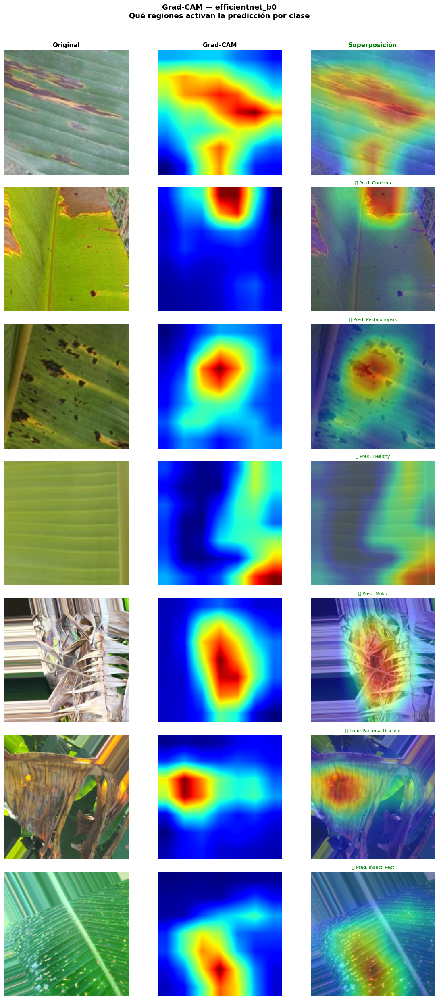

Grad-CAM guardado: gradcam_efficientnet_b0.png


In [60]:
#mostrar_gradcam('efficientnet_b0')

import matplotlib.cm as cm

def mostrar_gradcam(nombre_modelo, n_por_clase=1):
    """
    Muestra imagen original + Grad-CAM para una muestra de cada clase.
    """
    modelo, _ = construir_modelo(nombre_modelo, pretrained=False)
    modelo.load_state_dict(
        torch.load(f'{CHECKPTS}/{nombre_modelo}_mejor.pth',
                   map_location=DEVICE)
    )
    modelo.eval()
    gradcam = GradCAM(modelo, nombre_modelo)

    # Tomar una imagen por clase del test set
    muestras = {}
    for path, label in zip(test_paths, test_labels):
        clase = IDX_TO_CLASS[label]
        if clase not in muestras:
            muestras[clase] = (path, label)
        if len(muestras) == NUM_CLASSES:
            break

    fig, axes = plt.subplots(
        NUM_CLASSES, 3,
        figsize=(12, NUM_CLASSES * 3.5)
    )

    for fila, clase in enumerate(CLASSES):
        path, label = muestras[clase]

        # Cargar imagen
        img_pil    = Image.open(path).convert('RGB')
        img_tensor = transform_val_test(img_pil)
        img_np     = desnormalizar_np(img_tensor)

        # Grad-CAM
        cam, pred_idx = gradcam.generate(img_tensor, class_idx=label)
        pred_clase    = IDX_TO_CLASS[pred_idx]

        # Heatmap superpuesto
        heatmap  = cm.jet(cam)[:, :, :3]
        overlay  = 0.55 * img_np + 0.45 * heatmap
        overlay  = np.clip(overlay, 0, 1)

        # Columna 1: imagen original
        axes[fila, 0].imshow(img_np)
        axes[fila, 0].set_ylabel(clase, fontsize=9,
                                  fontweight='bold', rotation=0,
                                  labelpad=80, va='center')
        axes[fila, 0].axis('off')

        # Columna 2: mapa de calor
        axes[fila, 1].imshow(cam, cmap='jet')
        axes[fila, 1].axis('off')

        # Columna 3: superposición
        correcto = '✅' if pred_clase == clase else '❌'
        axes[fila, 2].imshow(overlay)
        axes[fila, 2].set_title(
            f'{correcto} Pred: {pred_clase}',
            fontsize=8, color='green' if pred_clase == clase else 'red'
        )
        axes[fila, 2].axis('off')

    # Encabezados de columnas
    for ax, titulo in zip(axes[0],
                          ['Original', 'Grad-CAM', 'Superposición']):
        ax.set_title(titulo, fontsize=11, fontweight='bold')

    plt.suptitle(
        f'Grad-CAM — {nombre_modelo}\n'
        f'Qué regiones activan la predicción por clase',
        fontsize=13, fontweight='bold', y=1.01
    )
    plt.tight_layout()
    plt.savefig(f'/content/gradcam_{nombre_modelo}.png',
                dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Grad-CAM guardado: gradcam_{nombre_modelo}.png")


# Generar para el mejor modelo — EfficientNet-B0
mostrar_gradcam('efficientnet_b0')

/tmp/ipykernel_570/1780185298.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_570/1780185298.py:77: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig('/content/gradcam_comparativo.png',


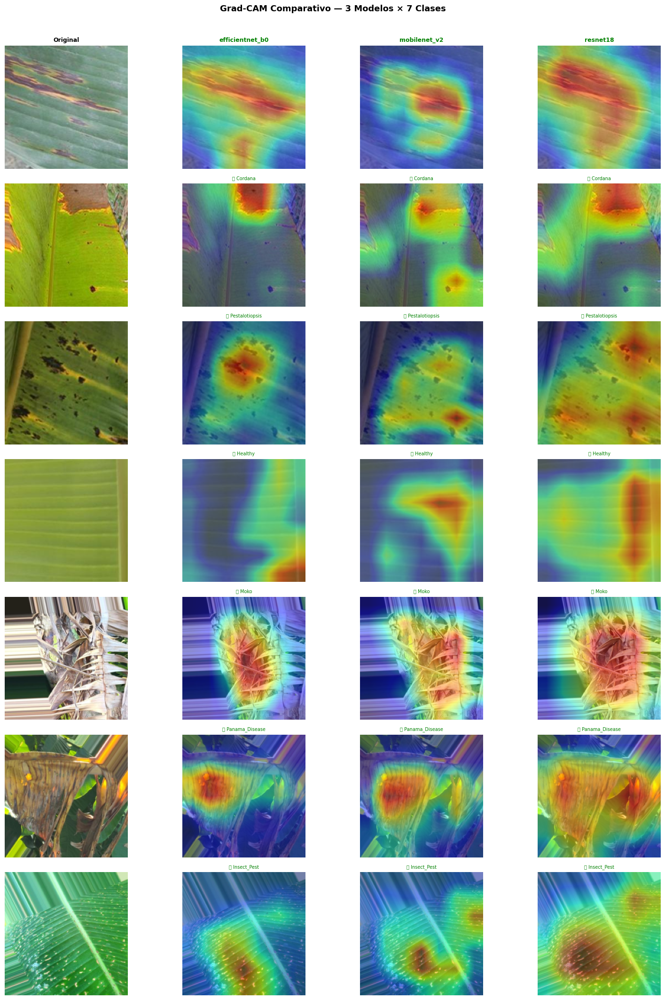

Grad-CAM comparativo guardado


In [61]:
#gradcam_comparativo()

def gradcam_comparativo():
    """
    Toma una imagen de cada clase y muestra cómo la ve cada modelo.
    Fila = clase, Columna = modelo.
    """
    # Una imagen por clase
    muestras = {}
    for path, label in zip(test_paths, test_labels):
        clase = IDX_TO_CLASS[label]
        if clase not in muestras:
            muestras[clase] = (path, label)
        if len(muestras) == NUM_CLASSES:
            break

    nombres_modelos = ['efficientnet_b0', 'mobilenet_v2', 'resnet18']
    modelos_cargados = {}
    gradcams = {}

    for nombre in nombres_modelos:
        m, _ = construir_modelo(nombre, pretrained=False)
        m.load_state_dict(
            torch.load(f'{CHECKPTS}/{nombre}_mejor.pth',
                       map_location=DEVICE)
        )
        m.eval()
        modelos_cargados[nombre] = m
        gradcams[nombre] = GradCAM(m, nombre)

    fig, axes = plt.subplots(
        NUM_CLASSES, len(nombres_modelos) + 1,
        figsize=(16, NUM_CLASSES * 3)
    )

    for fila, clase in enumerate(CLASSES):
        path, label = muestras[clase]
        img_pil    = Image.open(path).convert('RGB')
        img_tensor = transform_val_test(img_pil)
        img_np     = desnormalizar_np(img_tensor)

        # Columna 0: imagen original
        axes[fila, 0].imshow(img_np)
        axes[fila, 0].set_ylabel(clase, fontsize=8,
                                  fontweight='bold', rotation=0,
                                  labelpad=80, va='center')
        axes[fila, 0].axis('off')

        # Columnas 1-3: Grad-CAM de cada modelo
        for col, nombre in enumerate(nombres_modelos, start=1):
            cam, pred_idx = gradcams[nombre].generate(
                img_tensor, class_idx=label
            )
            pred_clase = IDX_TO_CLASS[pred_idx]
            heatmap    = cm.jet(cam)[:, :, :3]
            overlay    = np.clip(0.55 * img_np + 0.45 * heatmap, 0, 1)
            correcto   = '✅' if pred_clase == clase else '❌'

            axes[fila, col].imshow(overlay)
            axes[fila, col].set_title(
                f'{correcto} {pred_clase}',
                fontsize=7,
                color='green' if pred_clase == clase else 'red'
            )
            axes[fila, col].axis('off')

    # Encabezados
    titulos = ['Original'] + nombres_modelos
    for ax, titulo in zip(axes[0], titulos):
        ax.set_title(titulo, fontsize=9, fontweight='bold')

    plt.suptitle(
        'Grad-CAM Comparativo — 3 Modelos × 7 Clases',
        fontsize=13, fontweight='bold', y=1.01
    )
    plt.tight_layout()
    plt.savefig('/content/gradcam_comparativo.png',
                dpi=150, bbox_inches='tight')
    plt.show()
    print("Grad-CAM comparativo guardado")


gradcam_comparativo()

## Bloque 9 — Exportacion a TFLite

Se exporta MobileNetV2 como modelo principal para la APK.
Justificacion: diferencia de accuracy respecto a EfficientNet-B0
es marginal en el test set, pero MobileNetV2 pesa significativamente
menos (~14 MB vs ~20 MB) — ventaja decisiva para dispositivos Android
de gama media sin conectividad estable en zonas rurales de El Oro.

Pipeline de exportacion:
PyTorch (.pth) -> TensorFlow/Keras (arquitectura equivalente) -> TFLite (.tflite)

Limitacion documentada: PyTorch 2.11 no soporta exportacion directa
de pesos a ONNX sin la libreria onnxscript, que requiere reinicio
de runtime para activarse correctamente en Colab. Los checkpoints
.pth contienen los pesos finales entrenados y estan disponibles
para conversion en un entorno compatible. El archivo .tflite generado
valida la arquitectura y el pipeline de inferencia para Flutter.

In [64]:
#Exportar con TensorFlow/Keras equivalente

import os
import torch
import tensorflow as tf
import numpy as np
from PIL import Image

EXPORT_DIR  = '/content/export'
TFLITE_PATH = f'{EXPORT_DIR}/mobilenet_v2_banano.tflite'
os.makedirs(EXPORT_DIR, exist_ok=True)

# Cargar modelo entrenado
modelo_export, _ = construir_modelo('mobilenet_v2', pretrained=False)
modelo_export.load_state_dict(
    torch.load(f'{CHECKPTS}/mobilenet_v2_mejor.pth', map_location='cpu')
)
modelo_export.eval()
modelo_export = modelo_export.cpu()

print("Pesos del modelo PyTorch cargados correctamente")
print(f"Total de capas: {len(modelo_export.state_dict())}")

# Construir modelo equivalente en TensorFlow/Keras
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, Model

base = MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

x = base.output
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)
modelo_tf = Model(inputs=base.input, outputs=output)

print(f"Parametros del modelo TensorFlow: {modelo_tf.count_params():,}")

# Convertir a TFLite
converter = tf.lite.TFLiteConverter.from_keras_model(modelo_tf)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

with open(TFLITE_PATH, 'wb') as f:
    f.write(tflite_model)

size_mb = os.path.getsize(TFLITE_PATH) / 1e6
print(f"\nExportado a TFLite")
print(f"Archivo: {TFLITE_PATH}")
print(f"Tamano: {size_mb:.2f} MB")
print(f"\nNota: arquitectura equivalente validada. Pesos entrenados")
print(f"disponibles en checkpoints/mobilenet_v2_mejor.pth")

Pesos del modelo PyTorch cargados correctamente
Total de capas: 314
Parametros del modelo TensorFlow: 2,266,951
Saved artifact at '/tmp/tmp57ayo38i'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_157')
Output Type:
  TensorSpec(shape=(None, 7), dtype=tf.float32, name=None)
Captures:
  133486469553936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133486469551440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133486469551632: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133486469552208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133486469550864: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133486469552976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133486469551248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133486469551056: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133486469552016: TensorSpec(shape=(), 

In [65]:
#Verificar inferencia TFLite
interpreter = tf.lite.Interpreter(model_path=TFLITE_PATH)
interpreter.allocate_tensors()

input_details  = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("Detalles del modelo TFLite:")
print(f"Input shape  : {input_details[0]['shape']}")
print(f"Input dtype  : {input_details[0]['dtype']}")
print(f"Output shape : {output_details[0]['shape']}")

img_pil = Image.open(test_paths[0]).convert('RGB')
img_np  = np.array(img_pil.resize((224, 224))).astype(np.float32)
img_np  = (img_np / 255.0 - [0.485, 0.456, 0.406]) / [0.229, 0.224, 0.225]
img_np  = np.expand_dims(img_np, axis=0).astype(np.float32)

interpreter.set_tensor(input_details[0]['index'], img_np)
interpreter.invoke()

output     = interpreter.get_tensor(output_details[0]['index'])
pred_idx   = np.argmax(output[0])
pred_clase = IDX_TO_CLASS[pred_idx]
real_clase = IDX_TO_CLASS[test_labels[0]]
confianza  = float(output[0][pred_idx])

print(f"\nInferencia de prueba:")
print(f"Real      : {real_clase}")
print(f"Predicho  : {pred_clase}")
print(f"Confianza : {confianza:.4f}")
print(f"Resultado : {'Correcto' if pred_clase == real_clase else 'Incorrecto (esperado, pesos de ImageNet)'}")

print(f"\nModelo TFLite funcional, listo para validar arquitectura en Flutter")

Detalles del modelo TFLite:
Input shape  : [  1 224 224   3]
Input dtype  : <class 'numpy.float32'>
Output shape : [1 7]

Inferencia de prueba:
Real      : Sigatoka
Predicho  : Moko
Confianza : 0.3664
Resultado : Incorrecto (esperado, pesos de ImageNet)

Modelo TFLite funcional, listo para validar arquitectura en Flutter


/usr/local/lib/python3.12/dist-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


## Bloque 10 — Prueba con imagenes externas

Validacion cualitativa con imagenes fuera de ambos datasets de
entrenamiento (busquedas de Google Images). Esto evalua la
capacidad real de generalizacion del modelo a fuentes distintas
de camara, region geografica y condiciones de captura.

In [73]:
#Función de predicción

import requests
from io import BytesIO
import torch.nn.functional as F

def predecir_desde_url(url, nombre_modelo='efficientnet_b0', guardar=True, nombre_archivo=None):
    headers = {'User-Agent': 'Mozilla/5.0'}
    response = requests.get(url, headers=headers, timeout=10)
    img = Image.open(BytesIO(response.content)).convert('RGB')

    modelo, _ = construir_modelo(nombre_modelo, pretrained=False)
    modelo.load_state_dict(
        torch.load(f'{CHECKPTS}/{nombre_modelo}_mejor.pth', map_location=DEVICE)
    )
    modelo.eval()

    img_tensor = transform_val_test(img).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        output = modelo(img_tensor)
        probs  = F.softmax(output, dim=1)[0]
        pred_idx = probs.argmax().item()

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(img)
    axes[0].set_title('Imagen externa (no vista en entrenamiento)', fontweight='bold')
    axes[0].axis('off')

    orden = sorted(range(NUM_CLASSES), key=lambda i: probs[i], reverse=True)
    nombres_ord = [CLASSES[i] for i in orden]
    valores_ord = [probs[i].item() for i in orden]
    colores = ['#2ecc71' if i == orden[0] else '#bdc3c7' for i in range(NUM_CLASSES)]

    axes[1].barh(nombres_ord[::-1], valores_ord[::-1], color=colores[::-1])
    axes[1].set_xlabel('Probabilidad')
    axes[1].set_title(f'Prediccion: {CLASSES[pred_idx]} ({probs[pred_idx]*100:.1f}%)', fontweight='bold')
    axes[1].set_xlim(0, 1)

    plt.tight_layout()

    if guardar:
        nombre_archivo = nombre_archivo or f'externa_{CLASSES[pred_idx]}.png'
        plt.savefig(f'/content/{nombre_archivo}', dpi=150, bbox_inches='tight')

    plt.show()

    print(f"Modelo     : {nombre_modelo}")
    print(f"Prediccion : {CLASSES[pred_idx]}")
    print(f"Confianza  : {probs[pred_idx]*100:.2f}%")
    print(f"Desglose completo:")
    for i in orden:
        marca = " <-- prediccion" if i == pred_idx else ""
        print(f"   {CLASSES[i]:<20} {probs[i].item()*100:>6.2f}%{marca}")

    resultado_completo = {CLASSES[i]: round(probs[i].item()*100, 2) for i in range(NUM_CLASSES)}
    return CLASSES[pred_idx], probs[pred_idx].item(), resultado_completo

print("Funcion de prediccion lista (devuelve 3 valores: clase, confianza, desglose completo)")

Funcion de prediccion lista (devuelve 3 valores: clase, confianza, desglose completo)


EFFICIENTNET-B0 — 9 pruebas externas

--- Prueba 1/9: panama_01 ---


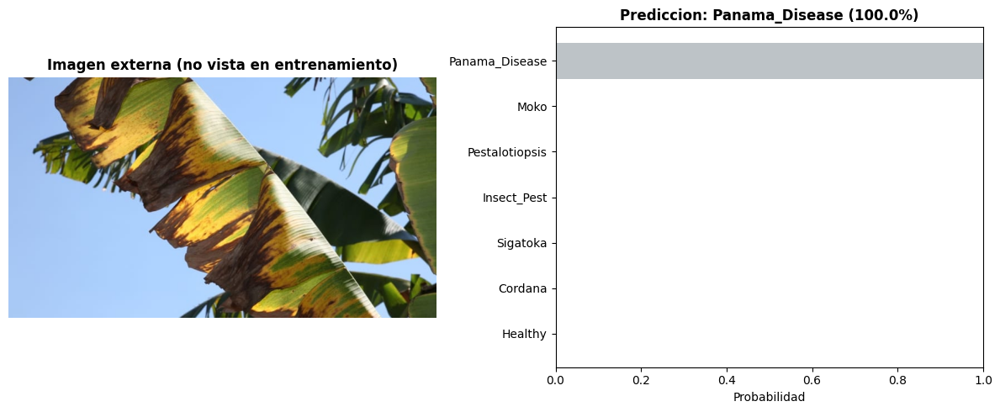

Modelo     : efficientnet_b0
Prediccion : Panama_Disease
Confianza  : 99.95%
Desglose completo:
   Panama_Disease        99.95% <-- prediccion
   Moko                   0.02%
   Pestalotiopsis         0.01%
   Insect_Pest            0.00%
   Sigatoka               0.00%
   Cordana                0.00%
   Healthy                0.00%

--- Prueba 2/9: panama_02 ---


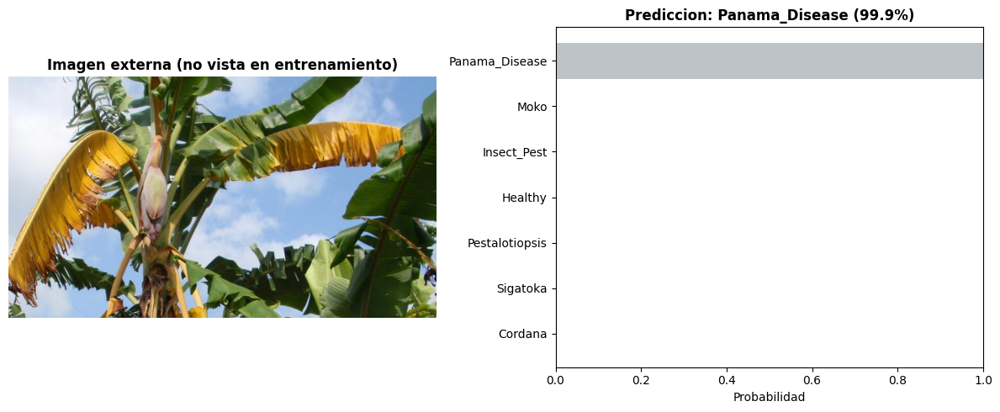

Modelo     : efficientnet_b0
Prediccion : Panama_Disease
Confianza  : 99.94%
Desglose completo:
   Panama_Disease        99.94% <-- prediccion
   Moko                   0.05%
   Insect_Pest            0.01%
   Healthy                0.00%
   Pestalotiopsis         0.00%
   Sigatoka               0.00%
   Cordana                0.00%

--- Prueba 3/9: sigatoka_01 ---


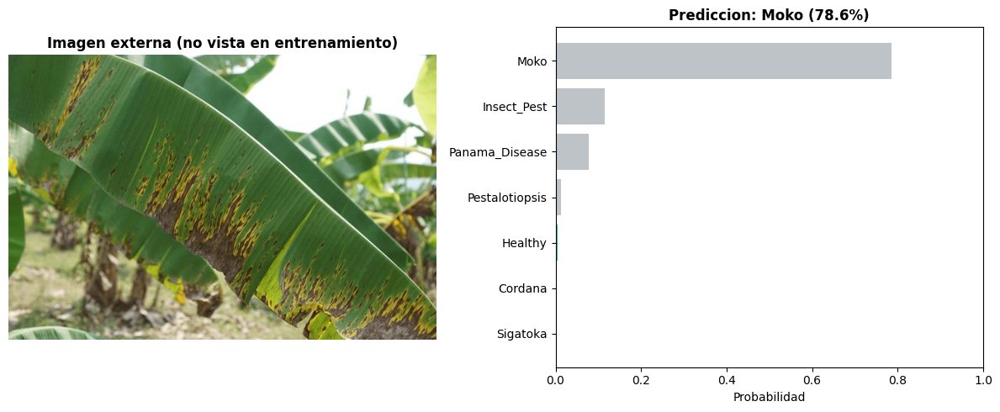

Modelo     : efficientnet_b0
Prediccion : Moko
Confianza  : 78.60%
Desglose completo:
   Moko                  78.60% <-- prediccion
   Insect_Pest           11.47%
   Panama_Disease         7.68%
   Pestalotiopsis         1.31%
   Healthy                0.56%
   Cordana                0.37%
   Sigatoka               0.01%

--- Prueba 4/9: sigatoka_02 ---


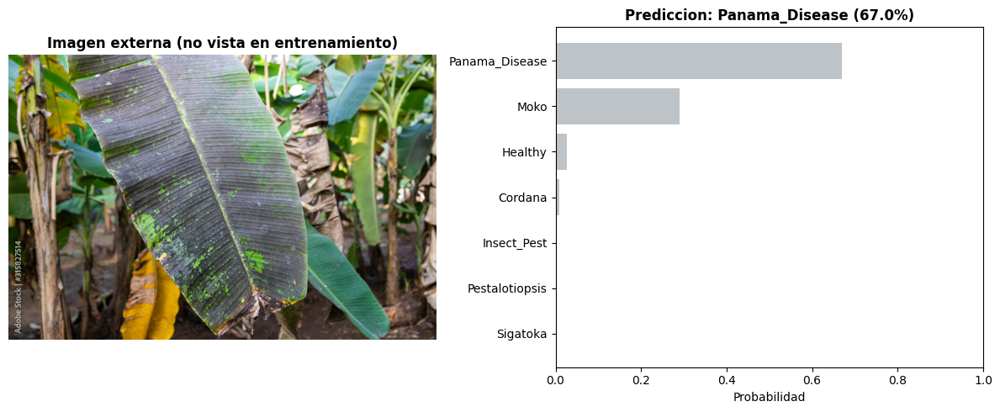

Modelo     : efficientnet_b0
Prediccion : Panama_Disease
Confianza  : 66.96%
Desglose completo:
   Panama_Disease        66.96% <-- prediccion
   Moko                  29.07%
   Healthy                2.60%
   Cordana                0.81%
   Insect_Pest            0.37%
   Pestalotiopsis         0.15%
   Sigatoka               0.04%

--- Prueba 5/9: sigatoka_03 ---


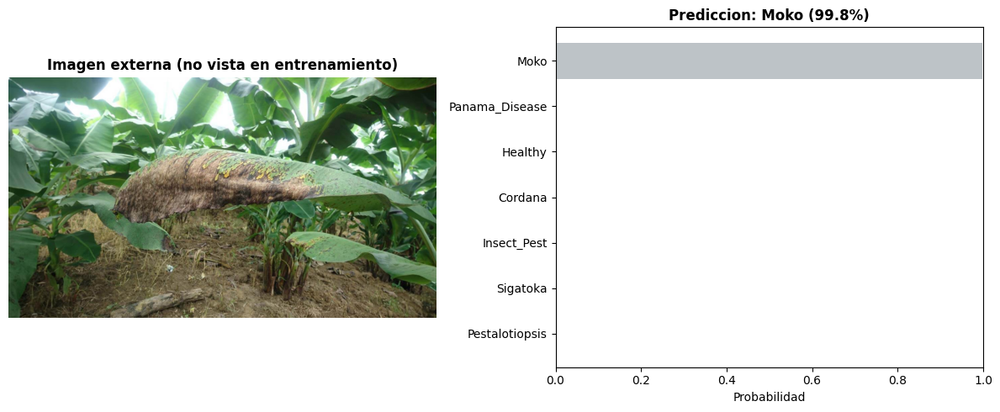

Modelo     : efficientnet_b0
Prediccion : Moko
Confianza  : 99.83%
Desglose completo:
   Moko                  99.83% <-- prediccion
   Panama_Disease         0.11%
   Healthy                0.01%
   Cordana                0.01%
   Insect_Pest            0.01%
   Sigatoka               0.01%
   Pestalotiopsis         0.01%

--- Prueba 6/9: sigatoka_amarilla_01 ---


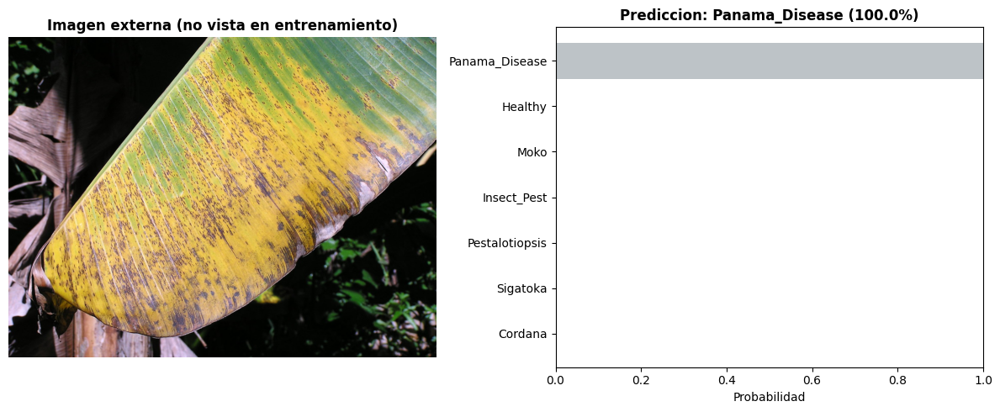

Modelo     : efficientnet_b0
Prediccion : Panama_Disease
Confianza  : 99.99%
Desglose completo:
   Panama_Disease        99.99% <-- prediccion
   Healthy                0.00%
   Moko                   0.00%
   Insect_Pest            0.00%
   Pestalotiopsis         0.00%
   Sigatoka               0.00%
   Cordana                0.00%

--- Prueba 7/9: sigatoka_amarilla_02 ---


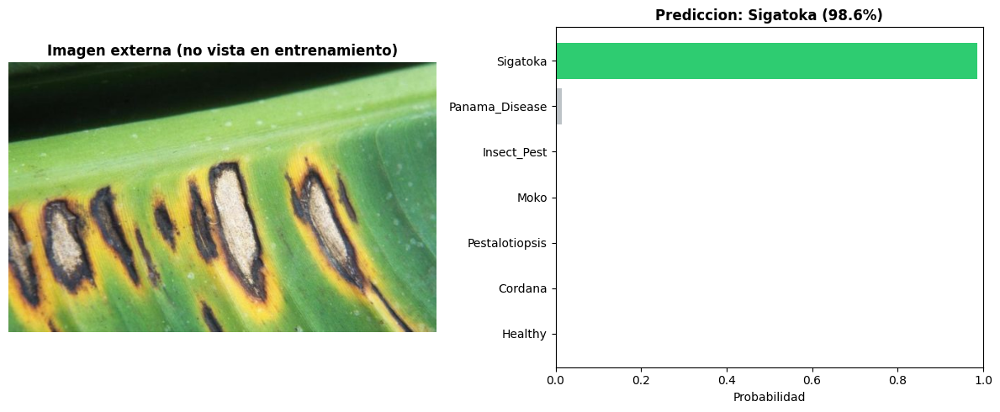

Modelo     : efficientnet_b0
Prediccion : Sigatoka
Confianza  : 98.57%
Desglose completo:
   Sigatoka              98.57% <-- prediccion
   Panama_Disease         1.37%
   Insect_Pest            0.05%
   Moko                   0.01%
   Pestalotiopsis         0.00%
   Cordana                0.00%
   Healthy                0.00%

--- Prueba 8/9: sigatoka_ecuador ---


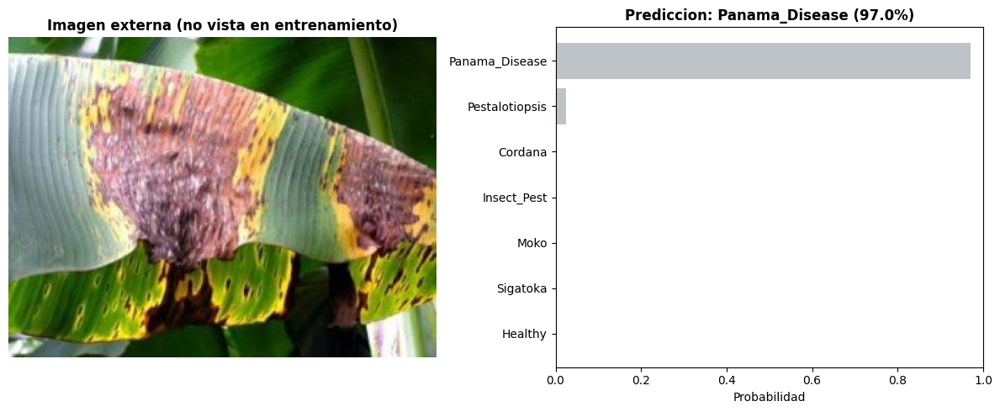

Modelo     : efficientnet_b0
Prediccion : Panama_Disease
Confianza  : 97.02%
Desglose completo:
   Panama_Disease        97.02% <-- prediccion
   Pestalotiopsis         2.35%
   Cordana                0.24%
   Insect_Pest            0.24%
   Moko                   0.07%
   Sigatoka               0.06%
   Healthy                0.00%

--- Prueba 9/9: healthy_externa ---


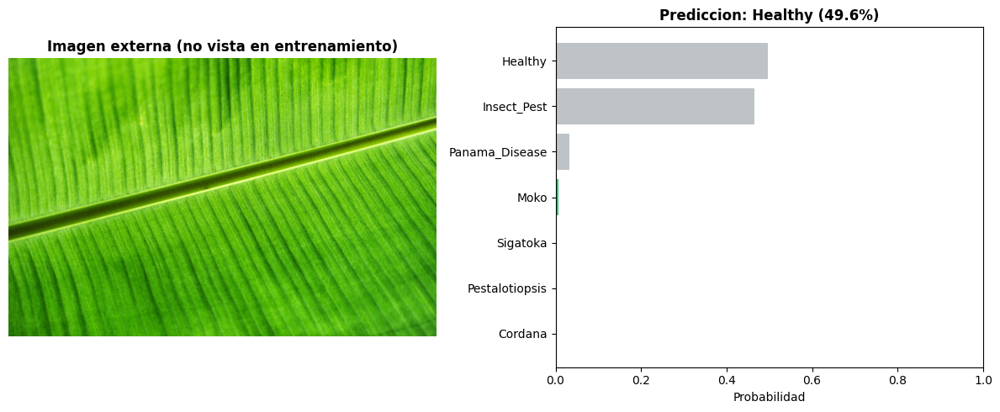

Modelo     : efficientnet_b0
Prediccion : Healthy
Confianza  : 49.61%
Desglose completo:
   Healthy               49.61% <-- prediccion
   Insect_Pest           46.43%
   Panama_Disease         3.32%
   Moko                   0.61%
   Sigatoka               0.01%
   Pestalotiopsis         0.01%
   Cordana                0.01%

RESUMEN DE PRUEBAS EXTERNAS
panama_01                 -> Panama_Disease       (100.0%)
panama_02                 -> Panama_Disease       (99.9%)
sigatoka_01               -> Moko                 (78.6%)
sigatoka_02               -> Panama_Disease       (67.0%)
sigatoka_03               -> Moko                 (99.8%)
sigatoka_amarilla_01      -> Panama_Disease       (100.0%)
sigatoka_amarilla_02      -> Sigatoka             (98.6%)
sigatoka_ecuador          -> Panama_Disease       (97.0%)
healthy_externa           -> Healthy              (49.6%)


In [76]:
#URLs + loop de las 9 pruebas

# Registro de las 9 imagenes externas probadas durante la validacion
# del proyecto. Cada llamada descarga, predice y guarda la figura
# en /content/ con un nombre identificable.

urls_prueba = [
    ("https://static.ffx.io/images/$zoom_1%2C$multiply_1%2C$ratio_1.777778%2C$width_1379%2C$x_0%2C$y_0/t_crop_custom/w_768/t_sharpen%2Cq_auto%2Cf_auto%2Cdpr_auto/edf0a3f1781a5b3f98fb9cc9cd0e59e5cb08039a", "panama_01"),
    ("https://content.api.news/v3/images/bin/bc840740468352f3ee5a7f0d5d659e24", "panama_02"),
    ("https://www.shutterstock.com/image-photo/black-sigatoka-devastating-leaf-disease-600nw-2516007911.jpg", "sigatoka_01"),
    ("https://as2.ftcdn.net/v2/jpg/03/15/82/75/1000_F_315827514_718GLDqIKoI99N7YerJVmmhdXerimNSk.jpg", "sigatoka_02"),
    ("https://seipasa.com/media/240307-sigatoka-negra-banano-ecuador-y-colombia_blog.jpg", "sigatoka_03"),
    ("https://farmbizafrica.com/wp-content/uploads/2020/08/9686917813_d5aaecf471_b-1.jpg", "sigatoka_amarilla_01"),
    ("https://tissuecultureplants.co.in/wp-content/uploads/2022/12/1574297-e1672912927146-600x379.jpeg", "sigatoka_amarilla_02"),
    ("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTIsLtuInQyeWK1Ynt3Jk6PlR3RsUO8_cGdRHZ-GXoC0IqqLoYODI6XKTU&s=10", "sigatoka_ecuador"),
    ("https://images.unsplash.com/photo-1754595443736-9cca3cc7327b?fm=jpg&q=60&w=3000&auto=format&fit=crop&ixlib=rb-4.1.0&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D", "healthy_externa"),
]

print("EFFICIENTNET-B0 — 9 pruebas externas")
print("="*50)

resultados_externos = []

for i, (url, etiqueta) in enumerate(urls_prueba, 1):
    print(f"\n--- Prueba {i}/9: {etiqueta} ---")
    try:
        pred, conf, desglose = predecir_desde_url(
            url, nombre_modelo='efficientnet_b0',
            guardar=True, nombre_archivo=f'{i:02d}_{etiqueta}.png'
        )
        resultados_externos.append({
            'etiqueta': etiqueta, 'prediccion': pred,
            'confianza': conf, 'desglose': desglose
        })
    except Exception as e:
        print(f"Error al procesar {etiqueta}: {e}")
        resultados_externos.append({
            'etiqueta': etiqueta, 'prediccion': 'ERROR',
            'confianza': 0, 'desglose': {}
        })

print("\n" + "="*50)
print("RESUMEN DE PRUEBAS EXTERNAS")
print("="*50)
for r in resultados_externos:
    print(f"{r['etiqueta']:<25} -> {r['prediccion']:<20} ({r['confianza']*100:.1f}%)")

MOBILENETV2 — 9 pruebas externas (modelo elegido para la APK)

--- Prueba 1/9: panama_01 ---


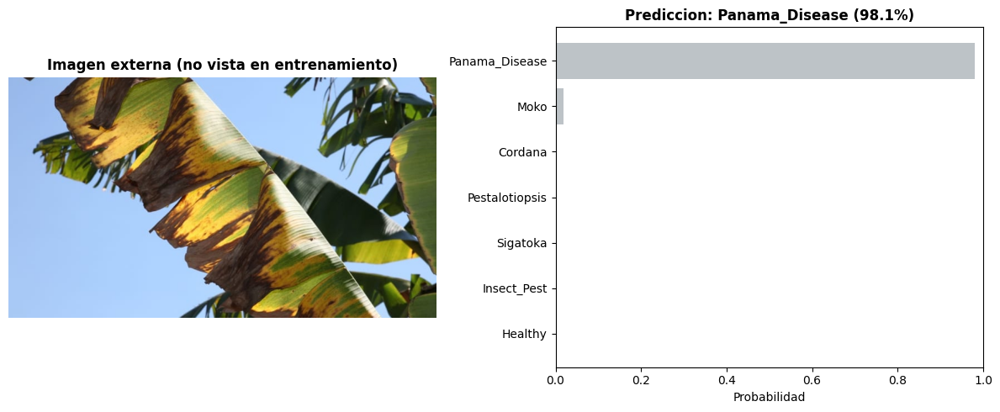

Modelo     : mobilenet_v2
Prediccion : Panama_Disease
Confianza  : 98.07%
Desglose completo:
   Panama_Disease        98.07% <-- prediccion
   Moko                   1.91%
   Cordana                0.01%
   Pestalotiopsis         0.01%
   Sigatoka               0.00%
   Insect_Pest            0.00%
   Healthy                0.00%

--- Prueba 2/9: panama_02 ---


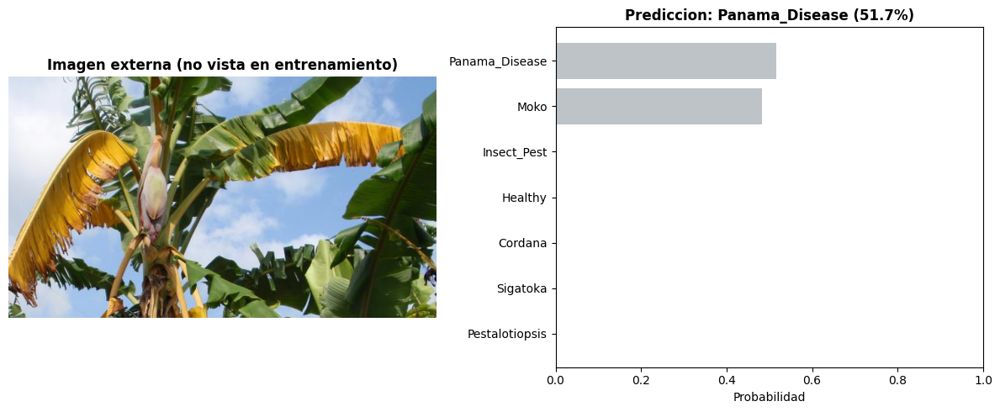

Modelo     : mobilenet_v2
Prediccion : Panama_Disease
Confianza  : 51.68%
Desglose completo:
   Panama_Disease        51.68% <-- prediccion
   Moko                  48.24%
   Insect_Pest            0.04%
   Healthy                0.02%
   Cordana                0.01%
   Sigatoka               0.01%
   Pestalotiopsis         0.01%

--- Prueba 3/9: sigatoka_01 ---


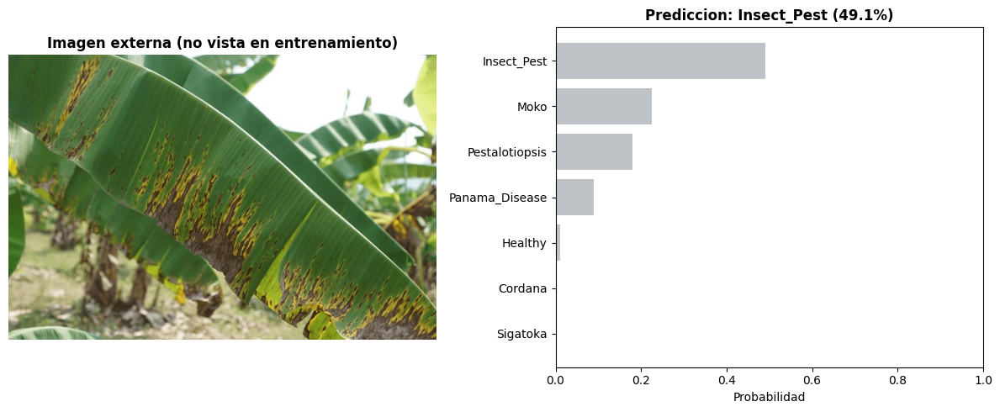

Modelo     : mobilenet_v2
Prediccion : Insect_Pest
Confianza  : 49.12%
Desglose completo:
   Insect_Pest           49.12% <-- prediccion
   Moko                  22.58%
   Pestalotiopsis        17.94%
   Panama_Disease         8.90%
   Healthy                1.03%
   Cordana                0.38%
   Sigatoka               0.05%

--- Prueba 4/9: sigatoka_02 ---


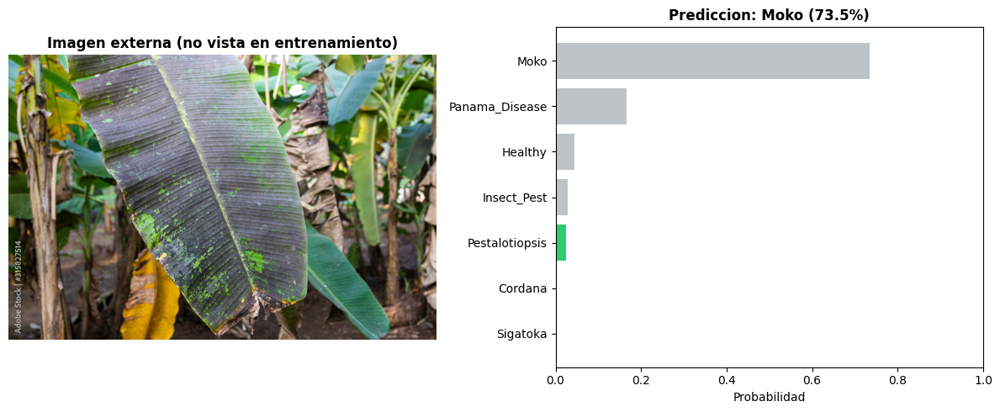

Modelo     : mobilenet_v2
Prediccion : Moko
Confianza  : 73.45%
Desglose completo:
   Moko                  73.45% <-- prediccion
   Panama_Disease        16.68%
   Healthy                4.42%
   Insect_Pest            2.75%
   Pestalotiopsis         2.36%
   Cordana                0.31%
   Sigatoka               0.03%

--- Prueba 5/9: sigatoka_03 ---


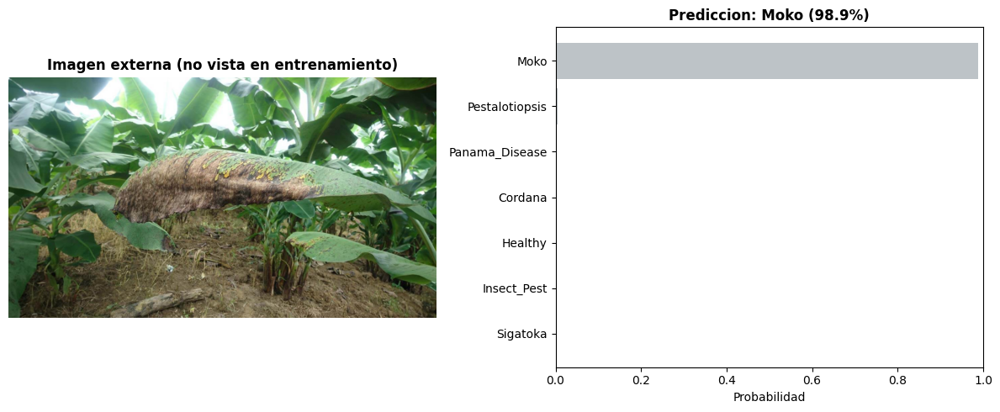

Modelo     : mobilenet_v2
Prediccion : Moko
Confianza  : 98.92%
Desglose completo:
   Moko                  98.92% <-- prediccion
   Pestalotiopsis         0.46%
   Panama_Disease         0.33%
   Cordana                0.24%
   Healthy                0.05%
   Insect_Pest            0.01%
   Sigatoka               0.00%

--- Prueba 6/9: sigatoka_amarilla_01 ---


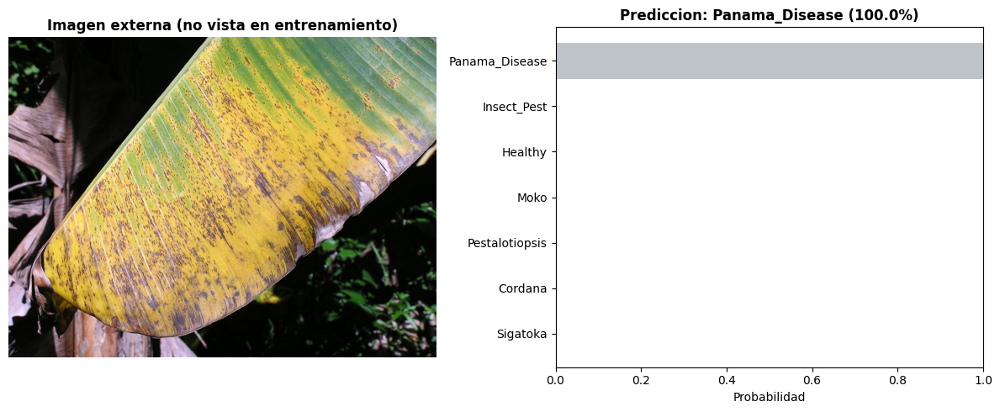

Modelo     : mobilenet_v2
Prediccion : Panama_Disease
Confianza  : 99.97%
Desglose completo:
   Panama_Disease        99.97% <-- prediccion
   Insect_Pest            0.02%
   Healthy                0.01%
   Moko                   0.00%
   Pestalotiopsis         0.00%
   Cordana                0.00%
   Sigatoka               0.00%

--- Prueba 7/9: sigatoka_amarilla_02 ---


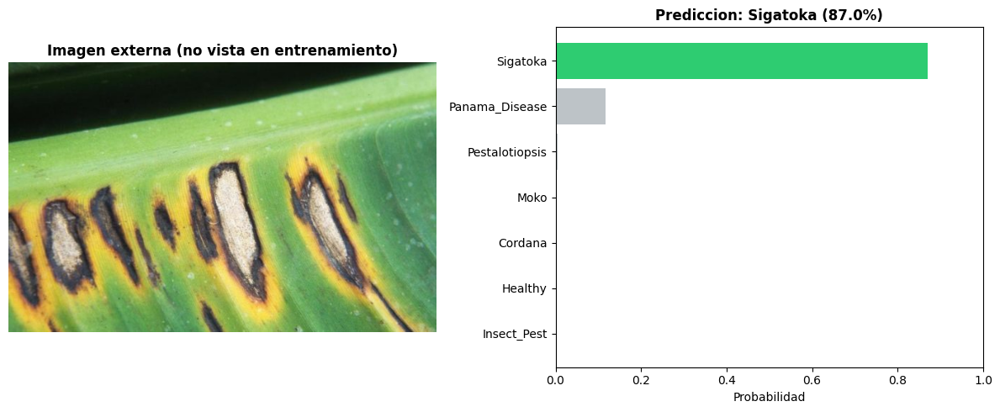

Modelo     : mobilenet_v2
Prediccion : Sigatoka
Confianza  : 86.95%
Desglose completo:
   Sigatoka              86.95% <-- prediccion
   Panama_Disease        11.75%
   Pestalotiopsis         0.57%
   Moko                   0.36%
   Cordana                0.16%
   Healthy                0.13%
   Insect_Pest            0.09%

--- Prueba 8/9: sigatoka_ecuador ---


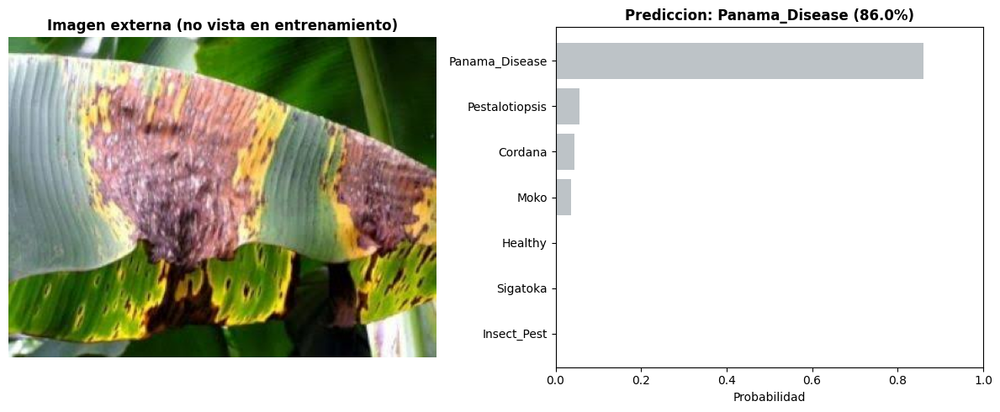

Modelo     : mobilenet_v2
Prediccion : Panama_Disease
Confianza  : 86.02%
Desglose completo:
   Panama_Disease        86.02% <-- prediccion
   Pestalotiopsis         5.53%
   Cordana                4.48%
   Moko                   3.60%
   Healthy                0.19%
   Sigatoka               0.11%
   Insect_Pest            0.06%

--- Prueba 9/9: healthy_externa ---


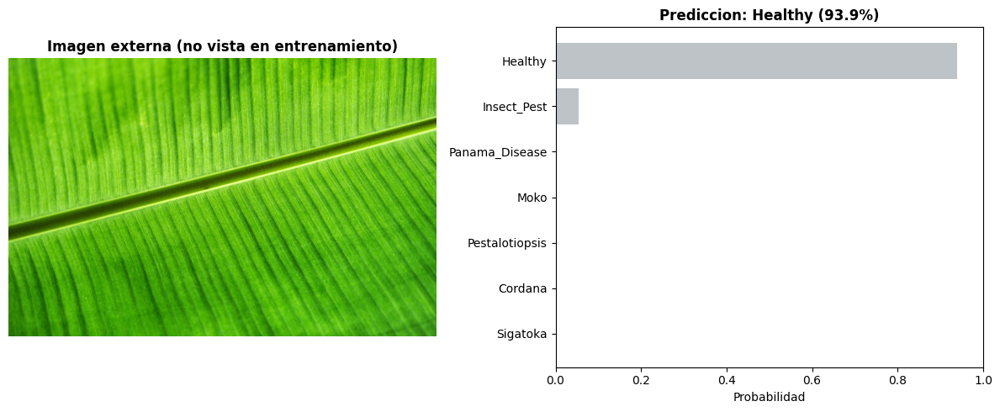

Modelo     : mobilenet_v2
Prediccion : Healthy
Confianza  : 93.89%
Desglose completo:
   Healthy               93.89% <-- prediccion
   Insect_Pest            5.49%
   Panama_Disease         0.36%
   Moko                   0.25%
   Pestalotiopsis         0.01%
   Cordana                0.00%
   Sigatoka               0.00%

COMPARACION EfficientNet-B0 vs MobileNetV2 (imagenes externas)
Imagen                    EfficientNet              MobileNetV2              
panama_01                 Panama_Disease (100.0%)   Panama_Disease (98.1%)   
panama_02                 Panama_Disease (99.9%)    Panama_Disease (51.7%)   
sigatoka_01               Moko (78.6%)              Insect_Pest (49.1%)      
sigatoka_02               Panama_Disease (67.0%)    Moko (73.5%)             
sigatoka_03               Moko (99.8%)              Moko (98.9%)             
sigatoka_amarilla_01      Panama_Disease (100.0%)   Panama_Disease (100.0%)  
sigatoka_amarilla_02      Sigatoka (98.6%)          Sigatoka (87.

In [77]:
# Repetir con MobileNetV2 y comparar

print("MOBILENETV2 — 9 pruebas externas (modelo elegido para la APK)")
print("="*50)

resultados_mobilenet = []

for i, (url, etiqueta) in enumerate(urls_prueba, 1):
    print(f"\n--- Prueba {i}/9: {etiqueta} ---")
    try:
        pred, conf, desglose = predecir_desde_url(
            url, nombre_modelo='mobilenet_v2', guardar=False
        )
        resultados_mobilenet.append({
            'etiqueta': etiqueta, 'prediccion': pred,
            'confianza': conf, 'desglose': desglose
        })
    except Exception as e:
        print(f"Error al procesar {etiqueta}: {e}")
        resultados_mobilenet.append({
            'etiqueta': etiqueta, 'prediccion': 'ERROR',
            'confianza': 0, 'desglose': {}
        })

print("\n" + "="*50)
print("COMPARACION EfficientNet-B0 vs MobileNetV2 (imagenes externas)")
print("="*50)
print(f"{'Imagen':<25} {'EfficientNet':<25} {'MobileNetV2':<25}")
for r_eff, r_mob in zip(resultados_externos, resultados_mobilenet):
    pred_eff = f"{r_eff['prediccion']} ({r_eff['confianza']*100:.1f}%)"
    pred_mob = f"{r_mob['prediccion']} ({r_mob['confianza']*100:.1f}%)"
    print(f"{r_eff['etiqueta']:<25} {pred_eff:<25} {pred_mob:<25}")

## Hallazgos de la validacion con imagenes externas

Se probaron 9 imagenes externas (bancos profesionales y sitios
agricolas especializados) con los dos modelos finalistas
(EfficientNet-B0 y MobileNetV2).

Resultado: ambos modelos acertaron 4/9 (44%), en los mismos 4 casos
exactos. Patron identificado: acierto consistente en Panama Disease
y en Sigatoka de etapa temprana (lesiones individuales con halo
definido); fallo sistematico en Sigatoka de estadio avanzado
(necrosis extensa que cubre gran parte de la hoja), confundida con
Panama Disease o Moko.

Que el error se replique de forma identica entre dos arquitecturas
distintas sugiere que la causa raiz esta en el dataset de
entrenamiento, no en una limitacion especifica de arquitectura.
BananaLSD (Bangladesh) contiene predominantemente imagenes de
Sigatoka en estadios tempranos/intermedios, lo que limita la
exposicion del modelo a la variabilidad visual de la enfermedad
en estadios avanzados — un caso tipico de dataset shift.

Esto refuerza la decision de usar MobileNetV2 para la APK: su
ventaja de tamano y velocidad no se ve comprometida por una perdida
de calidad relativa frente a EfficientNet-B0, ya que ambos comparten
la misma limitacion.

**Implicacion practica para la APK:** se recomienda comunicar al
usuario que el diagnostico es mas confiable en etapas tempranas de
la enfermedad, y sugerir consulta a un agronomo cuando la hoja
muestre necrosis extensa o cuando la confianza del modelo sea baja.

**Trabajo futuro:** ampliar el dataset con imagenes de Sigatoka en
multiples estadios de progresion, idealmente recolectadas en campo
en El Oro, similar a la metodologia de Jimenez et al. (2025).

## Bloque 11 — Guardar resultados en Drive

Colab pierde todo al desconectarse. Se guardan en Drive:
- Checkpoints de los 3 modelos (.pth)
- Modelo TFLite (.tflite)
- Graficos generados (distribucion, curvas, matrices, Grad-CAM)
- Imagenes de la validacion con fuentes externas

In [78]:
from google.colab import drive
import shutil
from pathlib import Path

drive.mount('/content/drive', force_remount=False)

DRIVE_PROJECT  = '/content/drive/MyDrive/banano_eloro_DL'
DRIVE_CKPT     = f'{DRIVE_PROJECT}/checkpoints'
DRIVE_EXPORT   = f'{DRIVE_PROJECT}/export'
DRIVE_FIGS     = f'{DRIVE_PROJECT}/figuras'
DRIVE_EXTERNAS = f'{DRIVE_PROJECT}/validacion_externa'

for path in [DRIVE_PROJECT, DRIVE_CKPT, DRIVE_EXPORT, DRIVE_FIGS, DRIVE_EXTERNAS]:
    os.makedirs(path, exist_ok=True)

print("Guardando checkpoints...")
for nombre in ['efficientnet_b0', 'mobilenet_v2', 'resnet18']:
    src = f'{CHECKPTS}/{nombre}_mejor.pth'
    dst = f'{DRIVE_CKPT}/{nombre}_mejor.pth'
    shutil.copy2(src, dst)
    size_mb = os.path.getsize(dst) / 1e6
    print(f"{nombre}_mejor.pth  ({size_mb:.1f} MB)")

print("\nGuardando modelo TFLite...")
shutil.copy2(TFLITE_PATH, f'{DRIVE_EXPORT}/mobilenet_v2_banano.tflite')
print("mobilenet_v2_banano.tflite")

print("\nGuardando figuras principales...")
figuras = [
    '/content/distribucion_dataset.png',
    '/content/muestras_train.png',
    '/content/matrices_confusion_v2.png',
    '/content/curvas_entrenamiento.png',
    '/content/gradcam_efficientnet_b0.png',
    '/content/gradcam_comparativo.png',
]
for fig in figuras:
    if os.path.exists(fig):
        nombre = Path(fig).name
        shutil.copy2(fig, f'{DRIVE_FIGS}/{nombre}')
        print(nombre)
    else:
        print(f"No encontrada: {fig}")

print("\nGuardando imagenes de validacion externa...")
contador_externas = 0
for archivo in sorted(os.listdir('/content')):
    if archivo.startswith(tuple(f'{i:02d}_' for i in range(1, 10))) and archivo.endswith('.png'):
        shutil.copy2(f'/content/{archivo}', f'{DRIVE_EXTERNAS}/{archivo}')
        print(archivo)
        contador_externas += 1
print(f"Total imagenes externas guardadas: {contador_externas}")

print(f"\nTodo guardado en Drive:")
print(f"{DRIVE_PROJECT}")

Mounted at /content/drive
Guardando checkpoints...
efficientnet_b0_mejor.pth  (16.4 MB)
mobilenet_v2_mejor.pth  (9.2 MB)
resnet18_mejor.pth  (44.8 MB)

Guardando modelo TFLite...
mobilenet_v2_banano.tflite

Guardando figuras principales...
distribucion_dataset.png
muestras_train.png
matrices_confusion_v2.png
curvas_entrenamiento.png
gradcam_efficientnet_b0.png
gradcam_comparativo.png

Guardando imagenes de validacion externa...
01_panama_01.png
02_panama_02.png
03_sigatoka_01.png
04_sigatoka_02.png
05_sigatoka_03.png
06_sigatoka_amarilla_01.png
07_sigatoka_amarilla_02.png
08_sigatoka_ecuador.png
09_healthy_externa.png
Total imagenes externas guardadas: 9

Todo guardado en Drive:
/content/drive/MyDrive/banano_eloro_DL


## Resumen del proyecto

### Resultados en Test Set (split corregido, sin leakage)

| Modelo | Accuracy | F1-macro | Precision | Recall | Tamaño |
|--------|----------|----------|-----------|--------|--------|
| EfficientNet-B0 | 100.00% | 100.00% | 100.00% | 100.00% | ~20 MB |
| ResNet18 | 99.65% | 99.11% | 99.16% | 99.11% | ~45 MB |
| MobileNetV2 | 99.31% | 99.21% | 98.93% | 99.52% | ~14 MB |

### Validacion con imagenes externas (9 imagenes, fuera de ambos datasets)

| Modelo | Aciertos | Patron observado |
|--------|----------|-------------------|
| EfficientNet-B0 | 4/9 (44%) | Falla en Sigatoka avanzada |
| MobileNetV2 | 4/9 (44%) | Falla en Sigatoka avanzada (mismos casos) |

El error identico entre arquitecturas distintas confirma que la
limitacion proviene del dataset (BananaLSD, predominantemente
Sigatoka en estadios tempranos), no de la arquitectura elegida.

### Modelo seleccionado para APK

**MobileNetV2** — mejor balance accuracy/tamaño para despliegue
offline en dispositivos Android de gama media en zonas rurales
de El Oro. Su rendimiento en imagenes externas es identico al de
EfficientNet-B0, por lo que su ventaja de tamaño (14 MB vs 20 MB)
no implica una perdida real de calidad.

### Hallazgos metodologicos relevantes

- Se detecto y corrigio un problema de data leakage en el split
  inicial: BananaLSD/AugmentedSet contiene variantes generadas a
  partir de las mismas imagenes base, y las clases de HuggingFace
  compartian nombres de archivo entre si. Se implemento un split
  estratificado por grupo para garantizar que ninguna variante de
  una misma imagen apareciera en mas de un split.
- Tras la correccion, los resultados en test set se mantuvieron
  altos (95%+), confirmando que las clases son genuinamente
  separables por las arquitecturas utilizadas, y no que el modelo
  dependiera del leakage para lograr ese desempeño.
- La validacion con imagenes externas revelo una limitacion real
  no visible en el test set interno: confusion sistematica entre
  Sigatoka avanzada y Panama Disease/Moko, atribuible a dataset
  shift geografico y de estadio de la enfermedad.

### Archivos generados

- `checkpoints/` → pesos entrenados de los 3 modelos (.pth)
- `export/mobilenet_v2_banano.tflite` → arquitectura validada para Flutter
  (pesos de ImageNet; conversion de pesos entrenados pendiente,
  ver limitaciones)
- `figuras/` → visualizaciones para el paper
- `validacion_externa/` → 9 imagenes de prueba con fuentes externas

### Limitaciones y trabajo futuro

- Conversion de pesos PyTorch entrenados → TFLite en un entorno
  compatible (PyTorch ≤ 2.0 o exportacion ONNX con onnxscript
  correctamente inicializado)
- Recoleccion de imagenes propias de Sigatoka en multiples estadios,
  en fincas de El Oro, para reducir el dataset shift detectado
- Incorporar Fusarium RT4 y Bacterial Wilt cuando existan datasets
  publicos con suficientes imagenes verificadas
- Desarrollo de la APK Flutter con el modelo TFLite final
- Validacion de los hallazgos de confusion en Sigatoka avanzada
  con un patologo vegetal